In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

In [2]:
train = pd.read_csv("TrainingWiDS2021.csv")
test = pd.read_csv("UnlabeledWiDS2021.csv")

## Drop Unuseful columns
The datasets were studied in a previous notebook using SweetViz.The following columns were dropped because of no discernible or strong change in incidence of diebetes for the measures in the train set, very high rate of missing values, redundancy to other features with more data or a combination of the latter.  Another group of 48 features were questionable but had something of interest so they will remain in the datasets for now.


In [3]:
train = train.drop(['Unnamed: 0',
'readmission_status',
'd1_sysbp_noninvasive_max',
'd1_sysbp_noninvasive_min',
'd1_diasbp_noninvasive_max',
'd1_diasbp_noninvasive_min',
'h1_sysbp_noninvasive_max',
'h1_sysbp_noninvasive_min',
'h1_diasbp_noninvasive_max',
'h1_diasbp_noninvasive_min',
'h1_temp_max',
'urineoutput_apache',
'd1_albumin_max',
'd1_bilirubin_max',
'd1_bilirubin_min',
'd1_mbp_invasive_max',
'd1_mbp_invasive_min',
'd1_sysbp_invasive_max',
'd1_sysbp_invasive_min',
'h1_mbp_invasive_max',
'h1_mbp_invasive_min',
'h1_sysbp_invasive_max',
'h1_sysbp_invasive_min',
'd1_wbc_max',
'd1_wbc_min',
'h1_glucose_max',
'h1_glucose_min',
'd1_inr_max',
'd1_inr_min',
'h1_inr_max',
'h1_inr_min',
'd1_lactate_max',
'd1_lactate_min',
'h1_hemaglobin_max',
'h1_hemaglobin_min',
'h1_hematocrit_max',
'h1_hematocrit_min',
'h1_creatinine_max',
'h1_creatinine_min',
'h1_platelets_max',
'h1_platelets_min',
'h1_calcium_max',
'h1_calcium_min',
'h1_lactate_max',
'h1_lactate_min',
'h1_albumin_max',
'h1_albumin_min',
'h1_bilirubin_max',
'h1_bilirubin_min',
'd1_arterial_po2_max',
'd1_arterial_po2_min',
'd1_arterial_pco2_min',
'd1_arterial_ph_max',
'd1_arterial_ph_min',
'h1_potassium_max',
'h1_potassium_min',
'h1_sodium_max',
'h1_sodium_min',
'h1_wbc_max',
'h1_wbc_min',
'h1_arterial_pco2_min',
'aids',
'hepatic_failure',
'immunosuppression',
'leukemia',
'lymphoma',
'solid_tumor_with_metastasis',
'h1_arterial_po2_max',
'h1_arterial_po2_min',
'h1_arterial_ph_max',
'h1_arterial_ph_min',
'h1_pao2fio2ratio_max',
'h1_pao2fio2ratio_min'], axis = 1)

In [4]:
train.head()

,encounter_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,...,h1_bun_max,h1_bun_min,h1_hco3_max,h1_hco3_min,d1_arterial_pco2_max,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,cirrhosis,diabetes_mellitus
0,214826,118,68.0,22.732803,0,Caucasian,M,180.3,Floor,Floor,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1
1,246060,81,77.0,27.421875,0,Caucasian,F,160.0,Floor,Floor,...,9.0,9.0,27.0,27.0,37.0,54.8,51.000000,37.0,0,1
2,276985,118,25.0,31.952749,0,Caucasian,F,172.7,Emergency Department,Accident & Emergency,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0
3,262220,118,81.0,22.635548,1,Caucasian,F,165.1,Operating Room,Operating Room / Recovery,...,NaN,NaN,NaN,NaN,37.0,342.5,236.666667,36.0,0,0
4,201746,33,19.0,NaN,0,Caucasian,M,188.0,NaN,Accident & Emergency,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0


In [5]:
test = test.drop(['Unnamed: 0',
'readmission_status',
'd1_sysbp_noninvasive_max',
'd1_sysbp_noninvasive_min',
'd1_diasbp_noninvasive_max',
'd1_diasbp_noninvasive_min',
'h1_sysbp_noninvasive_max',
'h1_sysbp_noninvasive_min',
'h1_diasbp_noninvasive_max',
'h1_diasbp_noninvasive_min',
'h1_temp_max',
'urineoutput_apache',
'd1_albumin_max',
'd1_bilirubin_max',
'd1_bilirubin_min',
'd1_mbp_invasive_max',
'd1_mbp_invasive_min',
'd1_sysbp_invasive_max',
'd1_sysbp_invasive_min',
'h1_mbp_invasive_max',
'h1_mbp_invasive_min',
'h1_sysbp_invasive_max',
'h1_sysbp_invasive_min',
'd1_wbc_max',
'd1_wbc_min',
'h1_glucose_max',
'h1_glucose_min',
'd1_inr_max',
'd1_inr_min',
'h1_inr_max',
'h1_inr_min',
'd1_lactate_max',
'd1_lactate_min',
'h1_hemaglobin_max',
'h1_hemaglobin_min',
'h1_hematocrit_max',
'h1_hematocrit_min',
'h1_creatinine_max',
'h1_creatinine_min',
'h1_platelets_max',
'h1_platelets_min',
'h1_calcium_max',
'h1_calcium_min',
'h1_lactate_max',
'h1_lactate_min',
'h1_albumin_max',
'h1_albumin_min',
'h1_bilirubin_max',
'h1_bilirubin_min',
'd1_arterial_po2_max',
'd1_arterial_po2_min',
'd1_arterial_pco2_min',
'd1_arterial_ph_max',
'd1_arterial_ph_min',
'h1_potassium_max',
'h1_potassium_min',
'h1_sodium_max',
'h1_sodium_min',
'h1_wbc_max',
'h1_wbc_min',
'h1_arterial_pco2_min',
'aids',
'hepatic_failure',
'immunosuppression',
'leukemia',
'lymphoma',
'solid_tumor_with_metastasis',
'h1_arterial_po2_max',
'h1_arterial_po2_min',
'h1_arterial_ph_max',
'h1_arterial_ph_min',
'h1_pao2fio2ratio_max',
'h1_pao2fio2ratio_min'], axis = 1)

In [6]:
test.head()


,encounter_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,...,d1_sodium_min,h1_bun_max,h1_bun_min,h1_hco3_max,h1_hco3_min,d1_arterial_pco2_max,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,cirrhosis
0,144740,10141,72,NaN,0,Caucasian,F,152.4,Floor,Accident & Emergency,...,130.0,40.0,40.0,26.0,26.0,NaN,NaN,NaN,NaN,0
1,141990,10141,86,NaN,0,Caucasian,F,175.3,Emergency Department,Accident & Emergency,...,144.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
2,142038,10141,72,NaN,0,Caucasian,F,162.6,Floor,Floor,...,137.0,16.0,16.0,32.0,32.0,NaN,NaN,NaN,NaN,0
3,138628,10141,66,NaN,0,Caucasian,M,177.8,Floor,Floor,...,136.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
4,141682,10141,89,NaN,0,Caucasian,M,170.2,Direct Admit,Accident & Emergency,...,133.0,26.0,26.0,30.0,30.0,NaN,NaN,NaN,NaN,0


# Feature Engineering

## hospital_id
Hospital_id, though numerical, is actually a categorical feature.  There are 204 distinct values of hospital_id in the train set and 190 in the test set.  The two sets have completely different hospital_id numbers.  It would likely be helpful to group them into smaller categories.  One way would be by determining the count of encounter_id per hospital and determining if these groups may have different instances of diebetes per group...

In [7]:
#so that we can see everything
pd.options.display.max_columns = None
pd.options.display.max_rows = 500

train.groupby(by = 'hospital_id').agg('count')

,encounter_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_min,d1_albumin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,h1_bun_max,h1_bun_min,h1_hco3_max,h1_hco3_min,d1_arterial_pco2_max,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,cirrhosis,diabetes_mellitus
hospital_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,1168,1149,1111,1168,1168,1168,1121,1052,1161,1168,1168,1168,1168,1140,166,1147,1149,1168,1168,150,821,821,498,1157,1157,1161,1157,940,1164,792,1168,1161,498,498,498,498,1162,820,976,1168,792,659,659,1163,1163,1164,1164,1160,1160,1116,1116,1162,1162,1163,1163,1163,1163,1154,1154,541,541,1103,1103,1111,1111,1096,1096,943,943,1114,1114,1108,1108,1103,1103,932,229,1020,1020,1021,1021,1020,1020,1066,1066,1020,1020,1005,1005,1005,1005,1005,1005,1020,1020,1020,1020,309,309,308,308,555,552,552,373,1168,1168
2,1280,1242,1260,1280,1280,1280,1277,530,1280,1280,1280,1280,1280,1263,606,1266,1270,1280,1280,584,1120,1127,367,1278,1278,1278,1278,1209,1280,1110,1280,1277,367,367,367,367,1279,1123,1276,1280,1085,141,141,1280,1280,1280,1280,1277,1277,1276,1276,1280,1280,1280,1280,1280,1280,1278,1278,98,98,1268,1268,1273,1273,1266,1266,1247,1247,1273,1273,1272,1272,1268,1268,1090,654,1166,1166,1167,1167,1176,1176,1249,1249,1162,1162,1160,1160,1160,1160,1151,1151,1172,1172,1169,1169,233,233,228,228,543,401,401,254,1280,1280
3,45,41,43,45,44,45,43,39,45,45,45,45,45,44,24,45,45,45,45,0,39,39,0,45,45,45,45,39,43,36,45,43,0,0,0,0,43,39,45,45,35,5,5,44,44,44,44,44,44,44,44,44,44,44,44,44,44,45,45,2,2,33,33,37,37,33,33,33,33,36,36,36,36,33,33,41,27,41,41,41,41,41,41,41,41,11,11,39,39,39,39,38,38,41,41,41,41,9,9,2,2,11,0,0,2,45,45
4,7,4,7,7,6,7,7,7,7,7,7,7,7,7,2,7,7,7,7,1,5,5,0,7,7,7,7,5,7,4,7,7,0,0,0,0,7,5,7,7,3,0,0,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,0,0,6,6,6,6,6,6,6,6,6,6,6,6,6,6,3,2,6,6,5,5,6,6,6,6,6,6,5,5,4,4,4,4,6,6,6,6,0,0,0,0,4,1,1,3,7,7
5,413,372,411,413,412,413,412,323,413,413,413,413,413,412,118,412,413,413,413,102,370,370,122,384,384,412,384,408,413,367,413,413,122,122,122,122,413,371,410,413,364,21,21,413,413,413,413,413,413,413,413,413,413,412,412,413,413,412,412,15,15,407,407,409,409,401,401,401,401,403,403,405,405,407,407,378,126,393,393,393,393,391,391,413,413,393,393,390,390,390,390,385,385,395,395,393,393,38,38,37,37,133,133,133,43,413,413
6,551,533,550,551,545,551,550,506,550,551,551,551,551,551,291,547,548,551,551,288,439,440,0,548,548,548,548,466,544,412,551,542,0,0,0,0,542,440,530,551,405,30,30,544,544,545,545,544,544,544,544,543,543,544,544,544,544,541,541,18,18,434,434,454,454,434,434,433,433,449,449,446,446,434,434,391,317,469,469,471

Definitely a large disparity among the number of patients each hospital treats in the training dataset.  Let's look at the test dataset...


In [8]:
test.groupby(by = 'hospital_id').agg('count')

,encounter_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_min,d1_albumin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,h1_bun_max,h1_bun_min,h1_hco3_max,h1_hco3_min,d1_arterial_pco2_max,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,cirrhosis
hospital_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
10001,10,10,9,10,10,10,10,1,10,10,10,10,10,9,6,10,10,10,10,6,6,6,3,10,10,10,10,10,10,7,10,10,3,3,3,3,10,6,9,10,7,0,0,10,10,10,10,10,10,10,10,10,10,10,10,10,10,9,9,0,0,10,10,10,10,10,10,10,10,10,10,10,10,10,10,5,7,8,8,8,8,8,8,10,10,7,7,9,9,9,9,9,9,8,8,8,8,2,2,2,2,5,5,5,2,10
10002,19,19,18,19,19,19,18,14,19,19,19,19,19,18,8,18,19,19,19,7,16,16,1,19,19,19,19,18,19,15,19,19,1,1,1,1,19,16,19,19,15,2,2,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,0,0,18,18,18,18,16,16,16,16,18,18,18,18,18,18,10,8,19,19,19,19,19,19,19,19,19,19,18,18,18,18,17,17,19,19,19,19,2,2,2,2,3,1,1,3,19
10003,52,52,3,52,49,52,51,49,52,52,52,52,52,3,11,52,52,52,52,11,20,21,15,51,51,51,51,39,52,27,52,52,15,15,15,15,50,20,52,52,25,23,23,52,52,52,52,52,52,52,52,52,52,52,52,52,52,52,52,20,20,47,47,51,51,47,47,38,38,44,44,49,49,47,47,47,14,38,38,38,38,39,39,48,48,39,39,43,43,43,43,43,43,43,43,39,39,4,4,4,4,15,15,15,10,52
10004,125,125,125,125,125,125,125,121,125,125,125,125,125,125,62,125,125,125,125,59,107,107,47,125,125,125,125,114,125,102,125,125,47,47,47,47,125,107,125,125,99,33,33,125,125,125,125,125,125,125,125,125,125,125,125,125,125,125,125,30,30,125,125,124,124,123,123,122,122,125,125,125,125,125,125,102,68,112,112,112,112,112,112,119,119,112,112,109,109,109,109,105,105,112,112,112,112,28,28,28,28,55,54,54,24,125
10005,13,13,13,13,13,13,13,13,13,13,13,13,13,13,2,11,11,13,13,2,9,9,3,13,13,13,13,11,13,8,13,13,3,3,3,3,13,9,12,13,8,0,0,13,13,13,13,13,13,13,13,13,13,13,13,13,13,12,12,0,0,13,13,13,13,13,13,13,13,13,13,13,13,13,13,10,4,11,11,11,11,11,11,11,11,10,10,11,11,11,11,11,11,11,11,11,11,4,4,4,4,3,3,3,2,13
10006,78,78,78,78,78,78,78,6,78,78,78,78,78,78,40,75,78,78,78,38,63,63,17,78,78,78,78,74,78,64,78,78,17,17,17,17,78,64,78,78,59,14,14,78,78,78,78,78,78,78,78,78,78,78,78,78,78,78,78,12,12,78,78,78,78,77,77,75,75,77,77,77,77,78,78,50,54,78,78,78,78,78,78,78,78,0,0,74,74,74,74,73,73,78,78,78,78,14,14,0,0,22,17,17,8,78
10007,112,112,103,112,112,112,104,101,112,112,112,112,112,107,15,109,112,112,112,14,95,96,31,86,86,112,86,95,112,94,112,112,31,31,31,31,112,96,111,112,89,47,47,112,112,112,112,112,112,112,112,112,112,112,112,112,112,112,112,41,41,112,112,112,112,111,111,110,110,107,107,111,111,112,112,103,18,101,101,101,101,102,102,101,101,0,0,95,95,99,99,99,99,102,102,102,102,39,39

Let's add a column for encounter_per_hospital...

In [9]:
train['encounter_per_hospital'] = train.groupby(by='hospital_id')['encounter_id'].transform('count')
train

,encounter_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_min,d1_albumin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,h1_bun_max,h1_bun_min,h1_hco3_max,h1_hco3_min,d1_arterial_pco2_max,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,cirrhosis,diabetes_mellitus,encounter_per_hospital
0,214826,118,68.0,22.732803,0,Caucasian,M,180.3,Floor,Floor,92,admit,CTICU,0.541667,73.9,2.3,113.0,502.01,0,0,0.4,31.0,2.51,NaN,3.0,6.0,0.0,4.0,168.0,118.0,27.4,0,40.0,NaN,NaN,NaN,NaN,36.0,134.0,39.3,0,14.1,46.0,32.0,68.0,37.0,119.0,72.0,89.0,46.0,89.0,46.0,34.0,10.0,100.0,74.0,131.0,73.0,39.9,37.2,NaN,NaN,68.0,63.0,119.0,108.0,86.0,85.0,86.0,85.0,26.0,18.0,100.0,74.0,131.0,115.0,37.5,2.3,31.0,30.0,8.5,7.4,2.51,2.23,168.0,109.0,19.0,15.0,8.9,8.9,27.4,27.4,233.0,233.0,4.0,3.4,136.0,134.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,4306
1,246060,81,77.0,27.421875,0,Caucasian,F,160.0,Floor,Floor,90,admit,Med-Surg ICU,0.927778,70.2,NaN,108.0,203.01,0,0,NaN,9.0,0.56,1.0,1.0,3.0,0.0,1.0,145.0,120.0,36.9,0,46.0,37.0,37.0,51.0,7.450,33.0,145.0,35.1,1,12.7,NaN,NaN,95.0,31.0,118.0,72.0,120.0,38.0,120.0,38.0,32.0,12.0,100.0,70.0,159.0,67.0,36.3,35.1,NaN,NaN,61.0,48.0,114.0,100.0,85.0,57.0,85.0,57.0,31.0,28.0,95.0,70.0,95.0,71.0,36.3,1.6,11.0,9.0,8.6,8.0,0.71,0.56,145.0,128.0,27.0,26.0,11.3,11.1,36.9,36.1,557.0,487.0,4.2,3.8,145.0,145.0,9.0,9.0,27.0,27.0,37.0,54.8,51.000000,37.0,0,1,579
2,276985,118,25.0,31.952749,0,Caucasian,F,172.7,Emergency Department,Accident & Emergency,93,admit,Med-Surg ICU,0.000694,95.3,NaN,122.0,703.03,0,0,NaN,NaN,NaN,NaN,3.0,6.0,0.0,5.0,NaN,102.0,NaN,0,68.0,NaN,NaN,NaN,NaN,37.0,NaN,36.7,0,NaN,NaN,NaN,88.0,48.0,96.0,68.0,102.0,68.0,102.0,68.0,21.0,8.0,98.0,91.0,148.0,105.0,37.0,36.7,NaN,NaN,88.0,58.0,96.0,78.0,91.0,83.0,91.0,83.0,20.0,16.0,98.0,91.0,148.0,124.0,36.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,4306
3,262220,118,81.0,22.635548,1,Caucasian,F,165.1,Operating Room,Operating Room / Recovery,92,admit,CTICU,0.000694,61.7,NaN,203.0,1206.03,1,0,NaN,NaN,NaN,0.6,4.0,6.0,0.0,5.0,185.0,114.0,25.9,1,60.0,30.0,30.0,142.0,7.390,4.0,NaN,34.8,1,8.0,62.0,30.0,48.0,42.0,116.0,92.0,84.0,84.0,84.0,84.0,23.0,7.0,100.0,95.0,158.0,84.0,38.0,34.8,62.0,44.0,62.0,44.0,100.0,96.0,92.0,71.0,NaN,NaN,12.0,11.0,100.0,99.0,136.0,106.0,34.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,185.0,88.0,NaN,NaN,11.6,8.9,34.0,25.9,198.0,43.0,5.0,3.5,NaN,NaN,NaN,NaN,NaN,NaN,37.0,342.5,236.666667,36.0,0,0,4306
4,201746,33,19.0,NaN,0,Caucasian,M,188.0,NaN,Accident & Emergency,91,admit,Med-Surg ICU,0.073611,NaN,NaN,119.0,601.01,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60.0,NaN,0,103.

We can check against the train hospital groupby above that the numbers here in our new column are correct.  Let's do the same to the test set....


In [10]:
#so that we can see everything
pd.options.display.max_columns = None
pd.options.display.max_rows = None

test['encounter_per_hospital'] = test.groupby(by='hospital_id')['encounter_id'].transform('count')
test.head(100)

,encounter_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_min,d1_albumin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,h1_bun_max,h1_bun_min,h1_hco3_max,h1_hco3_min,d1_arterial_pco2_max,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,cirrhosis,encounter_per_hospital
0,144740,10141,72,NaN,0,Caucasian,F,152.4,Floor,Accident & Emergency,82,admit,Med-Surg ICU,0.015278,NaN,2.8,110.0,104.01,0,0,1.9,44.00,1.4900,NaN,4.0,6.0,0.0,5.0,97.0,38.0,39.9,0,54.0,NaN,NaN,NaN,NaN,31.0,130.0,36.40,0,5.4,NaN,NaN,104.0,40.0,66.0,38.0,123.0,54.0,123.0,54.0,35.00,15.0,100.0,96.0,149.0,76.0,38.700,35.6,NaN,NaN,59.0,59.0,46.0,44.0,80.0,80.0,80.0,80.0,19.0,19.0,97.0,96.0,116.0,116.0,36.400,2.8,44.0,40.0,9.8,9.3,1.49,1.4400,104.0,97.0,26.0,23.0,14.5,14.2,42.8000,39.9,173.0,173.00,5.700,4.9,132.0,130.0,40.0,40.0,26.0,26.0,NaN,NaN,NaN,NaN,0,12
1,141990,10141,86,NaN,0,Caucasian,F,175.3,Emergency Department,Accident & Emergency,82,admit,Med-Surg ICU,0.000000,NaN,NaN,117.0,106.01,0,0,NaN,19.00,0.9200,NaN,4.0,6.0,0.0,5.0,73.0,116.0,NaN,0,41.0,NaN,NaN,NaN,NaN,53.0,142.0,36.30,0,NaN,NaN,NaN,101.0,27.0,116.0,56.0,129.0,41.0,129.0,41.0,51.00,14.0,100.0,95.0,181.0,65.0,36.800,36.4,NaN,NaN,85.0,65.0,116.0,104.0,129.0,94.0,129.0,94.0,31.0,24.0,97.0,95.0,181.0,119.0,36.700,NaN,19.0,19.0,8.5,8.5,1.00,1.0000,102.0,73.0,27.0,27.0,NaN,NaN,NaN,NaN,NaN,NaN,3.900,3.8,144.0,144.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,12
2,142038,10141,72,NaN,0,Caucasian,F,162.6,Floor,Floor,82,admit,Med-Surg ICU,0.003472,NaN,3.2,302.0,109.01,0,0,0.9,24.00,0.7700,NaN,4.0,6.0,0.0,5.0,84.0,104.0,34.8,0,117.0,NaN,NaN,NaN,NaN,38.0,137.0,36.40,0,4.6,NaN,NaN,97.0,61.0,98.0,68.0,117.0,77.0,117.0,77.0,49.00,8.0,99.0,85.0,146.0,103.0,36.900,35.9,NaN,NaN,97.0,97.0,98.0,92.0,117.0,117.0,117.0,117.0,20.0,20.0,99.0,96.0,146.0,146.0,36.400,3.2,24.0,16.0,9.1,8.5,0.82,0.7700,141.0,84.0,32.0,31.0,11.8,11.5,36.6000,34.8,253.0,243.00,3.600,3.6,141.0,137.0,16.0,16.0,32.0,32.0,NaN,NaN,NaN,NaN,0,12
3,138628,10141,66,NaN,0,Caucasian,M,177.8,Floor,Floor,82,admit,Med-Surg ICU,0.884028,NaN,NaN,113.0,501.05,0,0,NaN,NaN,NaN,NaN,4.0,6.0,0.0,4.0,NaN,110.0,NaN,0,61.0,NaN,NaN,NaN,NaN,56.0,NaN,36.60,1,NaN,NaN,NaN,77.0,51.0,110.0,86.0,110.0,61.0,110.0,61.0,56.00,19.0,99.0,80.0,145.0,95.0,37.800,36.6,NaN,NaN,NaN,NaN,107.0,95.0,NaN,NaN,NaN,NaN,56.0,28.0,95.0,90.0,NaN,NaN,37.000,2.0,27.0,27.0,9.0,9.0,1.55,1.5500,84.0,84.0,24.0,24.0,10.8,10.8,34.3000,34.3,303.0,303.00,4.100,4.1,136.0,136.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,12
4,141682,10141,89,NaN,0,Caucasian,M,170.2,Direct Admit,Accident & Emergency,82,admit,Med-Surg ICU,0.013194,NaN,3.4,117.0,106.01,0,0,0.4,26.00,1.5000,NaN,4.0,6.0,0.0,5.0,99.0,34.0

We can see that these too are right. Let's compare the distributions of encounter_per_hospital by hospital_id...

<AxesSubplot:xlabel='encounter_per_hospital', ylabel='Density'>

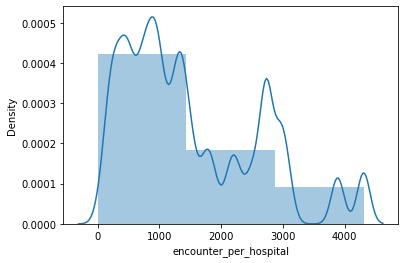

In [11]:
sns.distplot(train['encounter_per_hospital'], bins=3, kde=True)

<AxesSubplot:xlabel='encounter_per_hospital', ylabel='Density'>

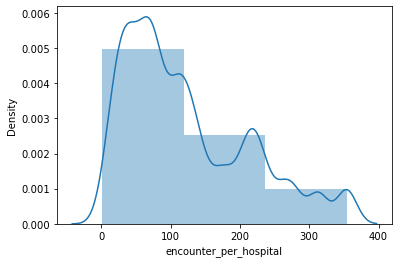

In [12]:
sns.distplot(test['encounter_per_hospital'], bins=3, kde=True)

The two datasets have similar distribtions of encounters-per_hospital.  So we could bin hospital_id into small, medium and large categories.


In [13]:
train['encounter_per_hospital'].value_counts(bins=3)

(-2.3049999999999997, 1436.667]    78698
(1436.667, 2871.333]               34287
(2871.333, 4306.0]                 17172
Name: encounter_per_hospital, dtype: int64

In [14]:
#create a colunm to store the bin category (1-3 (small, medium, large))
bins_train=[-2.303, 1436.667, 2871.333, 4306.0]
names = ['1', '2', '3']

train['hospital_size'] = pd.cut(train['encounter_per_hospital'], bins_train, labels=names)

In [15]:
train.head(300)

,encounter_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_min,d1_albumin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,h1_bun_max,h1_bun_min,h1_hco3_max,h1_hco3_min,d1_arterial_pco2_max,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,cirrhosis,diabetes_mellitus,encounter_per_hospital,hospital_size
0,214826,118,68.0,22.732803,0,Caucasian,M,180.30,Floor,Floor,92,admit,CTICU,0.541667,73.90,2.3,113.0,502.01,0,0,0.4,31.0,2.51,NaN,3.0,6.0,0.0,4.0,168.0,118.0,27.4,0,40.0,NaN,NaN,NaN,NaN,36.0,134.0,39.3,0,14.1,46.0,32.0,68.0,37.0,119.0,72.0,89.0,46.0,89.0,46.0,34.0,10.0,100.0,74.0,131.0,73.0,39.9,37.200,NaN,NaN,68.0,63.0,119.0,108.0,86.0,85.0,86.0,85.0,26.0,18.0,100.0,74.0,131.0,115.0,37.5,2.3,31.0,30.00,8.5,7.4,2.51,2.2300,168.0,109.0,19.0,15.0,8.9,8.9,27.4,27.4,233.0,233.00,4.0,3.4,136.0,134.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,4306,3
1,246060,81,77.0,27.421875,0,Caucasian,F,160.00,Floor,Floor,90,admit,Med-Surg ICU,0.927778,70.20,NaN,108.0,203.01,0,0,NaN,9.0,0.56,1.00,1.0,3.0,0.0,1.0,145.0,120.0,36.9,0,46.0,37.0,37.0,51.0,7.45000,33.0,145.0,35.1,1,12.7,NaN,NaN,95.0,31.0,118.0,72.0,120.0,38.0,120.0,38.0,32.0,12.0,100.0,70.0,159.0,67.0,36.3,35.100,NaN,NaN,61.0,48.0,114.0,100.0,85.0,57.0,85.0,57.0,31.0,28.0,95.0,70.0,95.0,71.0,36.3,1.6,11.0,9.00,8.6,8.0,0.71,0.5600,145.0,128.0,27.0,26.0,11.3,11.1,36.9,36.1,557.0,487.00,4.2,3.8,145.0,145.0,9.0,9.0,27.0,27.0,37.0,54.800000,51.000000,37.0,0,1,579,1
2,276985,118,25.0,31.952749,0,Caucasian,F,172.70,Emergency Department,Accident & Emergency,93,admit,Med-Surg ICU,0.000694,95.30,NaN,122.0,703.03,0,0,NaN,NaN,NaN,NaN,3.0,6.0,0.0,5.0,NaN,102.0,NaN,0,68.0,NaN,NaN,NaN,NaN,37.0,NaN,36.7,0,NaN,NaN,NaN,88.0,48.0,96.0,68.0,102.0,68.0,102.0,68.0,21.0,8.0,98.0,91.0,148.0,105.0,37.0,36.700,NaN,NaN,88.0,58.0,96.0,78.0,91.0,83.0,91.0,83.0,20.0,16.0,98.0,91.0,148.0,124.0,36.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,4306,3
3,262220,118,81.0,22.635548,1,Caucasian,F,165.10,Operating Room,Operating Room / Recovery,92,admit,CTICU,0.000694,61.70,NaN,203.0,1206.03,1,0,NaN,NaN,NaN,0.60,4.0,6.0,0.0,5.0,185.0,114.0,25.9,1,60.0,30.0,30.0,142.0,7.39000,4.0,NaN,34.8,1,8.0,62.0,30.0,48.0,42.0,116.0,92.0,84.0,84.0,84.0,84.0,23.0,7.0,100.0,95.0,158.0,84.0,38.0,34.800,62.0,44.0,62.0,44.0,100.0,96.0,92.0,71.0,NaN,NaN,12.0,11.0,100.0,99.0,136.0,106.0,34.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,185.0,88.0,NaN,NaN,11.6,8.9,34.0,25.9,198.0,43.00,5.0,3.5,NaN,NaN,NaN,NaN,NaN,NaN,37.0,342.500000,236.666667,36.0,0,0,4306,3
4,201746,33,19.0,NaN,0,Caucasian,M,188.00,NaN,Accident & Emergency,91,admit,Med-Surg ICU,0.073611,NaN,NaN,119.

Let's see if there is a difference in diebetes rate by hospital_size...


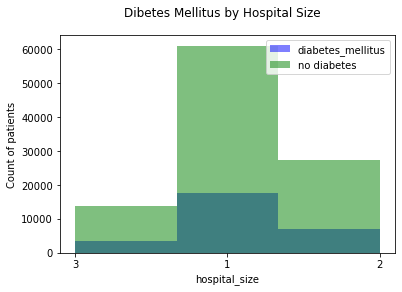

In [16]:
fig, ax = plt.subplots()

ax.hist(train[train["diabetes_mellitus"]==1]["hospital_size"], bins=3, alpha=0.5, color="blue", label="diabetes_mellitus")
ax.hist(train[train["diabetes_mellitus"]==0]["hospital_size"], bins=3, alpha=0.5, color="green", label="no diabetes")

ax.set_xlabel("hospital_size")
ax.set_ylabel("Count of patients")

fig.suptitle("Dibetes Mellitus by Hospital Size")

ax.legend();

This isn't very helpful.  They look proportianately the same.  Let's determine the proportion the entire train set that has diabetes...

In [17]:
diabetes_counts = train['diabetes_mellitus'].value_counts()
print(diabetes_counts)

0    102006
1     28151
Name: diabetes_mellitus, dtype: int64


In [18]:
train.shape


(130157, 110)

So 21.5% of the patients in the training set have diabetes (28151/130157).



In [19]:
train.groupby(by='hospital_size').sum()['diabetes_mellitus']

hospital_size
1    17724
2     7019
3     3408
Name: diabetes_mellitus, dtype: int64

So we need to know what proportion of each hospital size has diabetes....

In [20]:
train['hospital_size'].value_counts()

1    78698
2    34287
3    17172
Name: hospital_size, dtype: int64

So 22.5% of patients at small hospitals have diabetes mellitus.  20.5% of patients at medium hospitals have diabetes mellitus and 19.8% of of patients at large hospitals have diabetes mellitus.  

Let's do the same in the test data...

In [21]:
test['encounter_per_hospital'].value_counts(bins=3)

(0.646, 118.667]      6002
(118.667, 236.333]    3027
(236.333, 354.0]      1205
Name: encounter_per_hospital, dtype: int64

In [22]:
#create a colunm to store the bin category (1-3 (small, medium, large))
bins_test=[-2.303, 118.667, 236.333, 354.0]
names = ['1', '2', '3']

test['hospital_size'] = pd.cut(test['encounter_per_hospital'], bins_test, labels=names)

In [23]:
train.head(100)

,encounter_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_min,d1_albumin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,h1_bun_max,h1_bun_min,h1_hco3_max,h1_hco3_min,d1_arterial_pco2_max,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,cirrhosis,diabetes_mellitus,encounter_per_hospital,hospital_size
0,214826,118,68.0,22.732803,0,Caucasian,M,180.3,Floor,Floor,92,admit,CTICU,0.541667,73.9,2.3,113.0,502.01,0,0,0.4,31.0,2.51,NaN,3.0,6.0,0.0,4.0,168.0,118.0,27.4,0,40.0,NaN,NaN,NaN,NaN,36.0,134.0,39.3,0,14.1,46.0,32.0,68.0,37.0,119.0,72.0,89.0,46.0,89.0,46.0,34.0,10.0,100.0,74.0,131.0,73.0,39.9,37.200,NaN,NaN,68.0,63.0,119.0,108.0,86.0,85.0,86.0,85.0,26.0,18.0,100.0,74.0,131.0,115.0,37.5,2.3,31.0,30.0,8.5,7.4,2.51,2.23,168.0,109.0,19.0,15.0,8.9,8.9,27.4,27.4,233.0,233.00,4.0,3.4,136.0,134.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,4306,3
1,246060,81,77.0,27.421875,0,Caucasian,F,160.0,Floor,Floor,90,admit,Med-Surg ICU,0.927778,70.2,NaN,108.0,203.01,0,0,NaN,9.0,0.56,1.00,1.0,3.0,0.0,1.0,145.0,120.0,36.9,0,46.0,37.0,37.0,51.0,7.45,33.0,145.0,35.1,1,12.7,NaN,NaN,95.0,31.0,118.0,72.0,120.0,38.0,120.0,38.0,32.0,12.0,100.0,70.0,159.0,67.0,36.3,35.100,NaN,NaN,61.0,48.0,114.0,100.0,85.0,57.0,85.0,57.0,31.0,28.0,95.0,70.0,95.0,71.0,36.3,1.6,11.0,9.0,8.6,8.0,0.71,0.56,145.0,128.0,27.0,26.0,11.3,11.1,36.9,36.1,557.0,487.00,4.2,3.8,145.0,145.0,9.0,9.0,27.0,27.0,37.0,54.800000,51.000000,37.0,0,1,579,1
2,276985,118,25.0,31.952749,0,Caucasian,F,172.7,Emergency Department,Accident & Emergency,93,admit,Med-Surg ICU,0.000694,95.3,NaN,122.0,703.03,0,0,NaN,NaN,NaN,NaN,3.0,6.0,0.0,5.0,NaN,102.0,NaN,0,68.0,NaN,NaN,NaN,NaN,37.0,NaN,36.7,0,NaN,NaN,NaN,88.0,48.0,96.0,68.0,102.0,68.0,102.0,68.0,21.0,8.0,98.0,91.0,148.0,105.0,37.0,36.700,NaN,NaN,88.0,58.0,96.0,78.0,91.0,83.0,91.0,83.0,20.0,16.0,98.0,91.0,148.0,124.0,36.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,4306,3
3,262220,118,81.0,22.635548,1,Caucasian,F,165.1,Operating Room,Operating Room / Recovery,92,admit,CTICU,0.000694,61.7,NaN,203.0,1206.03,1,0,NaN,NaN,NaN,0.60,4.0,6.0,0.0,5.0,185.0,114.0,25.9,1,60.0,30.0,30.0,142.0,7.39,4.0,NaN,34.8,1,8.0,62.0,30.0,48.0,42.0,116.0,92.0,84.0,84.0,84.0,84.0,23.0,7.0,100.0,95.0,158.0,84.0,38.0,34.800,62.0,44.0,62.0,44.0,100.0,96.0,92.0,71.0,NaN,NaN,12.0,11.0,100.0,99.0,136.0,106.0,34.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,185.0,88.0,NaN,NaN,11.6,8.9,34.0,25.9,198.0,43.00,5.0,3.5,NaN,NaN,NaN,NaN,NaN,NaN,37.0,342.500000,236.666667,36.0,0,0,4306,3
4,201746,33,19.0,NaN,0,Caucasian,M,188.0,NaN,Accident & Emergency,91,admit,Med-Surg ICU,0.073611,NaN,NaN,119.0,601.01,0,0,NaN,NaN,

# icu_id
Now we will do the same thing with icu_id...


In [24]:
train.groupby(by = 'icu_id').agg('count')

,encounter_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_stay_type,icu_type,pre_icu_los_days,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_min,d1_albumin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,h1_bun_max,h1_bun_min,h1_hco3_max,h1_hco3_min,d1_arterial_pco2_max,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,cirrhosis,diabetes_mellitus,encounter_per_hospital,hospital_size
icu_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
82,150,150,132,116,150,149,150,147,136,149,150,150,150,116,69,148,148,150,150,69,134,135,16,148,148,148,148,138,150,129,150,150,16,16,16,16,150,135,150,150,124,9,9,150,150,150,150,150,150,150,150,150,150,150,150,150,150,150,150,7,7,149,149,149,149,142,142,140,140,146,146,148,148,149,149,138,67,134,134,135,135,135,135,139,139,134,134,130,130,130,130,126,126,137,137,135,135,9,9,11,11,19,17,17,4,150,150,150,150
83,185,185,169,153,185,181,185,184,162,185,185,185,185,153,106,185,185,185,185,106,153,154,39,185,185,185,185,162,185,147,185,184,39,39,39,39,182,153,181,185,144,13,13,185,185,185,185,184,184,184,184,185,185,185,185,185,185,185,185,8,8,183,183,185,185,171,171,168,168,177,177,182,182,183,183,155,113,162,162,162,162,163,163,169,169,162,162,150,150,149,149,146,146,164,164,162,162,14,14,15,15,51,46,46,18,185,185,185,185
85,270,270,254,181,270,265,270,269,246,270,270,270,270,181,135,261,268,270,270,135,254,254,84,268,268,268,268,270,270,256,270,270,84,84,84,84,269,255,270,270,249,178,178,270,270,270,270,270,270,256,256,270,270,270,270,270,270,270,270,159,159,266,266,267,267,262,262,201,201,264,264,267,267,266,266,231,144,264,264,264,264,264,264,270,270,264,264,263,263,264,264,259,259,266,266,265,265,111,111,110,110,108,104,104,56,270,270,270,270
87,233,233,223,118,233,227,233,232,204,233,233,233,233,118,48,232,233,233,233,45,105,110,55,232,232,232,232,185,233,132,233,233,55,55,55,55,233,105,233,233,122,96,96,233,233,233,233,233,233,230,230,233,233,233,233,233,233,233,233,86,86,230,230,231,231,220,220,183,183,208,208,231,231,230,230,207,65,187,187,187,187,193,193,219,219,192,192,197,197,197,197,194,194,209,209,192,192,17,17,15,15,67,61,61,42,233,233,233,233
89,142,142,141,142,142,141,142,142,131,142,142,142,142,142,17,137,142,142,142,17,117,119,25,141,141,141,141,139,142,121,142,142,25,25,25,25,142,119,142,142,120,58,58,142,142,142,142,142,142,142,142,142,142,142,142,142,142,142,142,41,41,139,139,140,140,132,132,122,122,139,139,140,140,139,139,123,21,121,121,121,121,123,123,141,141,122,122,119,119,119,119,119,119,126,126,123,123,10,10,10,10,35,34,34,9,142,142,142,142
90,579,579,539,451,579,573,579,568,531,579,579,579,579,453,229,555,579,579,579,227,479,495,118,575,575,575,575,530,579,502,579,579

Like hospital_id there is a large range of frequency of encounters per icu_id from 2 to over 1000....


In [25]:
test.groupby(by = 'icu_id').agg('count')

,encounter_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_stay_type,icu_type,pre_icu_los_days,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_min,d1_albumin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,h1_bun_max,h1_bun_min,h1_hco3_max,h1_hco3_min,d1_arterial_pco2_max,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,cirrhosis,encounter_per_hospital,hospital_size
icu_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
82,12,12,12,0,12,12,12,11,11,12,12,12,12,0,9,12,12,12,12,9,11,11,1,12,12,12,12,11,12,9,12,12,1,1,1,1,12,11,12,12,9,0,0,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,0,0,11,11,12,12,11,11,11,11,12,12,12,12,11,11,12,9,12,12,12,12,12,12,12,12,12,12,10,10,10,10,10,10,12,12,12,12,4,4,4,4,0,0,0,0,12,12,12
83,17,17,17,0,17,17,17,17,16,17,17,17,17,0,11,17,17,17,17,11,14,14,3,17,17,17,17,14,17,12,17,17,3,3,3,3,17,14,17,17,12,2,2,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,1,1,14,14,16,16,14,14,14,14,16,16,15,15,14,14,16,10,14,14,14,14,14,14,14,14,14,14,12,12,12,12,12,12,15,15,14,14,2,2,2,2,3,3,3,1,17,17,17
85,12,12,12,0,12,11,12,12,10,12,12,12,12,0,6,12,12,12,12,6,12,12,4,12,12,12,12,12,12,11,12,12,4,4,4,4,12,12,12,12,11,8,8,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,6,6,12,12,12,12,11,11,10,10,12,12,12,12,12,12,9,6,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,5,5,5,5,4,4,4,1,12,12,12
87,51,51,51,3,51,48,51,50,48,51,51,51,51,3,10,51,51,51,51,10,19,20,15,50,50,50,50,38,51,26,51,51,15,15,15,15,49,19,51,51,24,23,23,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,20,20,47,47,50,50,47,47,38,38,44,44,49,49,47,47,47,13,37,37,37,37,38,38,47,47,38,38,42,42,42,42,42,42,42,42,38,38,4,4,4,4,15,15,15,10,51,51,51
90,50,50,50,0,50,49,50,50,49,50,50,50,50,0,21,48,50,50,50,21,42,42,10,50,50,50,50,43,50,41,50,50,10,10,10,10,50,42,50,50,40,17,17,50,50,50,50,50,50,49,49,50,50,50,50,50,50,50,50,9,9,46,46,50,50,46,46,45,45,47,47,49,49,46,46,45,22,44,44,44,44,45,45,44,44,44,44,46,46,46,46,45,45,44,44,44,44,4,4,4,4,10,10,10,4,50,50,50
91,26,26,26,1,26,25,26,25,24,26,26,26,26,1,10,26,26,26,26,10,24,24,3,26,26,26,26,25,26,22,26,25,3,3,3,3,25,24,26,26,22,7,7,26,26,26,26,25,25,24,24,26,26,26,26,26,26,26,26,6,6,21,21,26,26,21,21,18,18,23,23,26,26,21,21,21,9,26,26,26,26,26,26,26,26,26,26,25,25,25,25,25,25,26,26,26,26,6,6,6,6,3,4,4,1,26,26,26
92,86,86,86,1,86,85,86,84,85,86,86,86,86,1,21,85,86,86,86,21,50,51,62,86,86,86,86,85,86,78,86,86,62,62,62,62,86,50,86,86,78,74,74,86,86,86,86,86,86,52,52,86,86,86,86,86,86,86,86,67,67,85,85,85,85,82,82,22,22,70,70,85,85,85,85,78,20,55,55,55,55,56,56,85,85,55,55,78,78,78,78,78,78,82,82,55,55,8,8,8,8,65,65,65,54,86,86,86
93,25,25,25,1,25,25,25,24,24,25,25,25,25,1,16,25,25,25,25,16,22,22,6,

In [26]:
train['encounter_per_icu'] = train.groupby(by='icu_id')['encounter_id'].transform('count')
train.head()


,encounter_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_min,d1_albumin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,h1_bun_max,h1_bun_min,h1_hco3_max,h1_hco3_min,d1_arterial_pco2_max,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,cirrhosis,diabetes_mellitus,encounter_per_hospital,hospital_size,encounter_per_icu
0,214826,118,68.0,22.732803,0,Caucasian,M,180.3,Floor,Floor,92,admit,CTICU,0.541667,73.9,2.3,113.0,502.01,0,0,0.4,31.0,2.51,NaN,3.0,6.0,0.0,4.0,168.0,118.0,27.4,0,40.0,NaN,NaN,NaN,NaN,36.0,134.0,39.3,0,14.1,46.0,32.0,68.0,37.0,119.0,72.0,89.0,46.0,89.0,46.0,34.0,10.0,100.0,74.0,131.0,73.0,39.9,37.2,NaN,NaN,68.0,63.0,119.0,108.0,86.0,85.0,86.0,85.0,26.0,18.0,100.0,74.0,131.0,115.0,37.5,2.3,31.0,30.0,8.5,7.4,2.51,2.23,168.0,109.0,19.0,15.0,8.9,8.9,27.4,27.4,233.0,233.0,4.0,3.4,136.0,134.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,4306,3,880
1,246060,81,77.0,27.421875,0,Caucasian,F,160.0,Floor,Floor,90,admit,Med-Surg ICU,0.927778,70.2,NaN,108.0,203.01,0,0,NaN,9.0,0.56,1.0,1.0,3.0,0.0,1.0,145.0,120.0,36.9,0,46.0,37.0,37.0,51.0,7.45,33.0,145.0,35.1,1,12.7,NaN,NaN,95.0,31.0,118.0,72.0,120.0,38.0,120.0,38.0,32.0,12.0,100.0,70.0,159.0,67.0,36.3,35.1,NaN,NaN,61.0,48.0,114.0,100.0,85.0,57.0,85.0,57.0,31.0,28.0,95.0,70.0,95.0,71.0,36.3,1.6,11.0,9.0,8.6,8.0,0.71,0.56,145.0,128.0,27.0,26.0,11.3,11.1,36.9,36.1,557.0,487.0,4.2,3.8,145.0,145.0,9.0,9.0,27.0,27.0,37.0,54.8,51.000000,37.0,0,1,579,1,579
2,276985,118,25.0,31.952749,0,Caucasian,F,172.7,Emergency Department,Accident & Emergency,93,admit,Med-Surg ICU,0.000694,95.3,NaN,122.0,703.03,0,0,NaN,NaN,NaN,NaN,3.0,6.0,0.0,5.0,NaN,102.0,NaN,0,68.0,NaN,NaN,NaN,NaN,37.0,NaN,36.7,0,NaN,NaN,NaN,88.0,48.0,96.0,68.0,102.0,68.0,102.0,68.0,21.0,8.0,98.0,91.0,148.0,105.0,37.0,36.7,NaN,NaN,88.0,58.0,96.0,78.0,91.0,83.0,91.0,83.0,20.0,16.0,98.0,91.0,148.0,124.0,36.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,4306,3,313
3,262220,118,81.0,22.635548,1,Caucasian,F,165.1,Operating Room,Operating Room / Recovery,92,admit,CTICU,0.000694,61.7,NaN,203.0,1206.03,1,0,NaN,NaN,NaN,0.6,4.0,6.0,0.0,5.0,185.0,114.0,25.9,1,60.0,30.0,30.0,142.0,7.39,4.0,NaN,34.8,1,8.0,62.0,30.0,48.0,42.0,116.0,92.0,84.0,84.0,84.0,84.0,23.0,7.0,100.0,95.0,158.0,84.0,38.0,34.8,62.0,44.0,62.0,44.0,100.0,96.0,92.0,71.0,NaN,NaN,12.0,11.0,100.0,99.0,136.0,106.0,34.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,185.0,88.0,NaN,NaN,11.6,8.9,34.0,25.9,198.0,43.0,5.0,3.5,NaN,NaN,NaN,NaN,NaN,NaN,37.0,342.5,236.666667,36.0,0,0,4306,3,880
4,201746,33,19.0,NaN,0,Caucasian,M,188.0,NaN,Accident & Emergency,91,admit,Med-Surg ICU,0.073611,NaN,NaN,119.0,601.01,0

In [27]:
test['encounter_per_icu'] = test.groupby(by='icu_id')['encounter_id'].transform('count')
test.head(100)

,encounter_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_min,d1_albumin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,h1_bun_max,h1_bun_min,h1_hco3_max,h1_hco3_min,d1_arterial_pco2_max,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,cirrhosis,encounter_per_hospital,hospital_size,encounter_per_icu
0,144740,10141,72,NaN,0,Caucasian,F,152.4,Floor,Accident & Emergency,82,admit,Med-Surg ICU,0.015278,NaN,2.8,110.0,104.01,0,0,1.9,44.00,1.4900,NaN,4.0,6.0,0.0,5.0,97.0,38.0,39.9,0,54.0,NaN,NaN,NaN,NaN,31.0,130.0,36.40,0,5.4,NaN,NaN,104.0,40.0,66.0,38.0,123.0,54.0,123.0,54.0,35.00,15.0,100.0,96.0,149.0,76.0,38.700,35.6,NaN,NaN,59.0,59.0,46.0,44.0,80.0,80.0,80.0,80.0,19.0,19.0,97.0,96.0,116.0,116.0,36.400,2.8,44.0,40.0,9.8,9.3,1.49,1.4400,104.0,97.0,26.0,23.0,14.5,14.2,42.8000,39.9,173.0,173.00,5.700,4.9,132.0,130.0,40.0,40.0,26.0,26.0,NaN,NaN,NaN,NaN,0,12,1,12
1,141990,10141,86,NaN,0,Caucasian,F,175.3,Emergency Department,Accident & Emergency,82,admit,Med-Surg ICU,0.000000,NaN,NaN,117.0,106.01,0,0,NaN,19.00,0.9200,NaN,4.0,6.0,0.0,5.0,73.0,116.0,NaN,0,41.0,NaN,NaN,NaN,NaN,53.0,142.0,36.30,0,NaN,NaN,NaN,101.0,27.0,116.0,56.0,129.0,41.0,129.0,41.0,51.00,14.0,100.0,95.0,181.0,65.0,36.800,36.4,NaN,NaN,85.0,65.0,116.0,104.0,129.0,94.0,129.0,94.0,31.0,24.0,97.0,95.0,181.0,119.0,36.700,NaN,19.0,19.0,8.5,8.5,1.00,1.0000,102.0,73.0,27.0,27.0,NaN,NaN,NaN,NaN,NaN,NaN,3.900,3.8,144.0,144.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,12,1,12
2,142038,10141,72,NaN,0,Caucasian,F,162.6,Floor,Floor,82,admit,Med-Surg ICU,0.003472,NaN,3.2,302.0,109.01,0,0,0.9,24.00,0.7700,NaN,4.0,6.0,0.0,5.0,84.0,104.0,34.8,0,117.0,NaN,NaN,NaN,NaN,38.0,137.0,36.40,0,4.6,NaN,NaN,97.0,61.0,98.0,68.0,117.0,77.0,117.0,77.0,49.00,8.0,99.0,85.0,146.0,103.0,36.900,35.9,NaN,NaN,97.0,97.0,98.0,92.0,117.0,117.0,117.0,117.0,20.0,20.0,99.0,96.0,146.0,146.0,36.400,3.2,24.0,16.0,9.1,8.5,0.82,0.7700,141.0,84.0,32.0,31.0,11.8,11.5,36.6000,34.8,253.0,243.00,3.600,3.6,141.0,137.0,16.0,16.0,32.0,32.0,NaN,NaN,NaN,NaN,0,12,1,12
3,138628,10141,66,NaN,0,Caucasian,M,177.8,Floor,Floor,82,admit,Med-Surg ICU,0.884028,NaN,NaN,113.0,501.05,0,0,NaN,NaN,NaN,NaN,4.0,6.0,0.0,4.0,NaN,110.0,NaN,0,61.0,NaN,NaN,NaN,NaN,56.0,NaN,36.60,1,NaN,NaN,NaN,77.0,51.0,110.0,86.0,110.0,61.0,110.0,61.0,56.00,19.0,99.0,80.0,145.0,95.0,37.800,36.6,NaN,NaN,NaN,NaN,107.0,95.0,NaN,NaN,NaN,NaN,56.0,28.0,95.0,90.0,NaN,NaN,37.000,2.0,27.0,27.0,9.0,9.0,1.55,1.5500,84.0,84.0,24.0,24.0,10.8,10.8,34.3000,34.3,303.0,303.00,4.100,4.1,136.0,136.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,12,1,12
4,141682,10141,89,NaN,0,Caucasian,M,170.2,Direct Admit,Accident & Emergency,82,admit,Med-Surg ICU,0.013194,NaN,3.4,117.0,106.0

<AxesSubplot:xlabel='encounter_per_icu', ylabel='Density'>

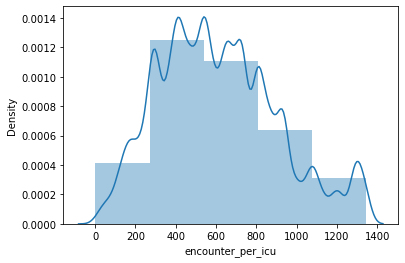

In [28]:
sns.distplot(train['encounter_per_icu'], bins=5, kde=True)

<AxesSubplot:xlabel='encounter_per_icu', ylabel='Density'>

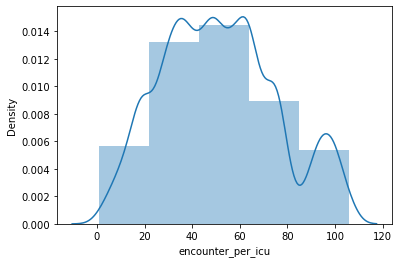

In [29]:
sns.distplot(test['encounter_per_icu'], bins=5, kde=True)

In [30]:
train['encounter_per_icu'].value_counts(bins=5)

(270.4, 538.8]      43673
(538.8, 807.2]      38753
(807.2, 1075.6]     22413
(0.657, 270.4]      14377
(1075.6, 1344.0]    10941
Name: encounter_per_icu, dtype: int64

In [31]:
#create a colunm to store the bin category (1-5 (mini,small, medium, large, mega))
bins_train=[0.657, 270.4, 538.8, 807.2, 1075.6, 1344.0]
names = ['1', '2', '3', '4', '5']

train['icu_size'] = pd.cut(train['encounter_per_icu'], bins_train, labels=names)

In [32]:
train.head()

,encounter_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_min,d1_albumin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,h1_bun_max,h1_bun_min,h1_hco3_max,h1_hco3_min,d1_arterial_pco2_max,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,cirrhosis,diabetes_mellitus,encounter_per_hospital,hospital_size,encounter_per_icu,icu_size
0,214826,118,68.0,22.732803,0,Caucasian,M,180.3,Floor,Floor,92,admit,CTICU,0.541667,73.9,2.3,113.0,502.01,0,0,0.4,31.0,2.51,NaN,3.0,6.0,0.0,4.0,168.0,118.0,27.4,0,40.0,NaN,NaN,NaN,NaN,36.0,134.0,39.3,0,14.1,46.0,32.0,68.0,37.0,119.0,72.0,89.0,46.0,89.0,46.0,34.0,10.0,100.0,74.0,131.0,73.0,39.9,37.2,NaN,NaN,68.0,63.0,119.0,108.0,86.0,85.0,86.0,85.0,26.0,18.0,100.0,74.0,131.0,115.0,37.5,2.3,31.0,30.0,8.5,7.4,2.51,2.23,168.0,109.0,19.0,15.0,8.9,8.9,27.4,27.4,233.0,233.0,4.0,3.4,136.0,134.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,4306,3,880,4
1,246060,81,77.0,27.421875,0,Caucasian,F,160.0,Floor,Floor,90,admit,Med-Surg ICU,0.927778,70.2,NaN,108.0,203.01,0,0,NaN,9.0,0.56,1.0,1.0,3.0,0.0,1.0,145.0,120.0,36.9,0,46.0,37.0,37.0,51.0,7.45,33.0,145.0,35.1,1,12.7,NaN,NaN,95.0,31.0,118.0,72.0,120.0,38.0,120.0,38.0,32.0,12.0,100.0,70.0,159.0,67.0,36.3,35.1,NaN,NaN,61.0,48.0,114.0,100.0,85.0,57.0,85.0,57.0,31.0,28.0,95.0,70.0,95.0,71.0,36.3,1.6,11.0,9.0,8.6,8.0,0.71,0.56,145.0,128.0,27.0,26.0,11.3,11.1,36.9,36.1,557.0,487.0,4.2,3.8,145.0,145.0,9.0,9.0,27.0,27.0,37.0,54.8,51.000000,37.0,0,1,579,1,579,3
2,276985,118,25.0,31.952749,0,Caucasian,F,172.7,Emergency Department,Accident & Emergency,93,admit,Med-Surg ICU,0.000694,95.3,NaN,122.0,703.03,0,0,NaN,NaN,NaN,NaN,3.0,6.0,0.0,5.0,NaN,102.0,NaN,0,68.0,NaN,NaN,NaN,NaN,37.0,NaN,36.7,0,NaN,NaN,NaN,88.0,48.0,96.0,68.0,102.0,68.0,102.0,68.0,21.0,8.0,98.0,91.0,148.0,105.0,37.0,36.7,NaN,NaN,88.0,58.0,96.0,78.0,91.0,83.0,91.0,83.0,20.0,16.0,98.0,91.0,148.0,124.0,36.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,4306,3,313,2
3,262220,118,81.0,22.635548,1,Caucasian,F,165.1,Operating Room,Operating Room / Recovery,92,admit,CTICU,0.000694,61.7,NaN,203.0,1206.03,1,0,NaN,NaN,NaN,0.6,4.0,6.0,0.0,5.0,185.0,114.0,25.9,1,60.0,30.0,30.0,142.0,7.39,4.0,NaN,34.8,1,8.0,62.0,30.0,48.0,42.0,116.0,92.0,84.0,84.0,84.0,84.0,23.0,7.0,100.0,95.0,158.0,84.0,38.0,34.8,62.0,44.0,62.0,44.0,100.0,96.0,92.0,71.0,NaN,NaN,12.0,11.0,100.0,99.0,136.0,106.0,34.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,185.0,88.0,NaN,NaN,11.6,8.9,34.0,25.9,198.0,43.0,5.0,3.5,NaN,NaN,NaN,NaN,NaN,NaN,37.0,342.5,236.666667,36.0,0,0,4306,3,880,4
4,201746,33,19.0,NaN,0,Caucasian,M,188.0,NaN,Accident & Emergency,91,admit,Med-Surg ICU,0.073611,NaN,N

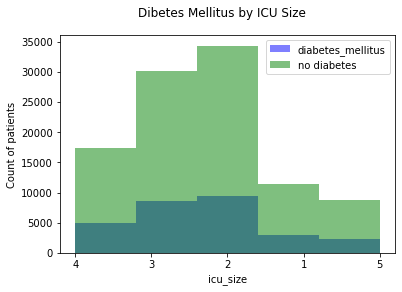

In [33]:
fig, ax = plt.subplots()

ax.hist(train[train["diabetes_mellitus"]==1]["icu_size"], bins=5, alpha=0.5, color="blue", label="diabetes_mellitus")
ax.hist(train[train["diabetes_mellitus"]==0]["icu_size"], bins=5, alpha=0.5, color="green", label="no diabetes")

ax.set_xlabel("icu_size")
ax.set_ylabel("Count of patients")

fig.suptitle("Dibetes Mellitus by ICU Size")

ax.legend();

In [34]:
train.groupby(by='icu_size').sum()['diabetes_mellitus']

icu_size
1    2902
2    9383
3    8639
4    4983
5    2244
Name: diabetes_mellitus, dtype: int64

In [35]:
train['icu_size'].value_counts()

2    43673
3    38753
4    22413
1    14377
5    10941
Name: icu_size, dtype: int64

So respectively from 1-5, diabetes mellitus incidence per icu_size is: 20.18%, 21.4%, 22.3%, 22.2%, 20.5%

Let's make the same column in the test set...

In [36]:
test['encounter_per_icu'].value_counts(bins=5)

(43.0, 64.0]     3242
(22.0, 43.0]     2881
(64.0, 85.0]     1661
(0.894, 22.0]    1299
(85.0, 106.0]    1151
Name: encounter_per_icu, dtype: int64

In [37]:
#create a colunm to store the bin category (1-5 (mini,small, medium, large, mega))
bins_test=[0.894, 22.0, 43.0, 64.0, 85.0, 106.0]
names = ['1', '2', '3', '4', '5']

test['icu_size'] = pd.cut(test['encounter_per_icu'], bins_train, labels=names)

In [38]:
test.head()

,encounter_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_min,d1_albumin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,h1_bun_max,h1_bun_min,h1_hco3_max,h1_hco3_min,d1_arterial_pco2_max,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,cirrhosis,encounter_per_hospital,hospital_size,encounter_per_icu,icu_size
0,144740,10141,72,NaN,0,Caucasian,F,152.4,Floor,Accident & Emergency,82,admit,Med-Surg ICU,0.015278,NaN,2.8,110.0,104.01,0,0,1.9,44.0,1.49,NaN,4.0,6.0,0.0,5.0,97.0,38.0,39.9,0,54.0,NaN,NaN,NaN,NaN,31.0,130.0,36.4,0,5.4,NaN,NaN,104.0,40.0,66.0,38.0,123.0,54.0,123.0,54.0,35.0,15.0,100.0,96.0,149.0,76.0,38.7,35.6,NaN,NaN,59.0,59.0,46.0,44.0,80.0,80.0,80.0,80.0,19.0,19.0,97.0,96.0,116.0,116.0,36.4,2.8,44.0,40.0,9.8,9.3,1.49,1.44,104.0,97.0,26.0,23.0,14.5,14.2,42.8,39.9,173.0,173.0,5.7,4.9,132.0,130.0,40.0,40.0,26.0,26.0,NaN,NaN,NaN,NaN,0,12,1,12,1
1,141990,10141,86,NaN,0,Caucasian,F,175.3,Emergency Department,Accident & Emergency,82,admit,Med-Surg ICU,0.000000,NaN,NaN,117.0,106.01,0,0,NaN,19.0,0.92,NaN,4.0,6.0,0.0,5.0,73.0,116.0,NaN,0,41.0,NaN,NaN,NaN,NaN,53.0,142.0,36.3,0,NaN,NaN,NaN,101.0,27.0,116.0,56.0,129.0,41.0,129.0,41.0,51.0,14.0,100.0,95.0,181.0,65.0,36.8,36.4,NaN,NaN,85.0,65.0,116.0,104.0,129.0,94.0,129.0,94.0,31.0,24.0,97.0,95.0,181.0,119.0,36.7,NaN,19.0,19.0,8.5,8.5,1.00,1.00,102.0,73.0,27.0,27.0,NaN,NaN,NaN,NaN,NaN,NaN,3.9,3.8,144.0,144.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,12,1,12,1
2,142038,10141,72,NaN,0,Caucasian,F,162.6,Floor,Floor,82,admit,Med-Surg ICU,0.003472,NaN,3.2,302.0,109.01,0,0,0.9,24.0,0.77,NaN,4.0,6.0,0.0,5.0,84.0,104.0,34.8,0,117.0,NaN,NaN,NaN,NaN,38.0,137.0,36.4,0,4.6,NaN,NaN,97.0,61.0,98.0,68.0,117.0,77.0,117.0,77.0,49.0,8.0,99.0,85.0,146.0,103.0,36.9,35.9,NaN,NaN,97.0,97.0,98.0,92.0,117.0,117.0,117.0,117.0,20.0,20.0,99.0,96.0,146.0,146.0,36.4,3.2,24.0,16.0,9.1,8.5,0.82,0.77,141.0,84.0,32.0,31.0,11.8,11.5,36.6,34.8,253.0,243.0,3.6,3.6,141.0,137.0,16.0,16.0,32.0,32.0,NaN,NaN,NaN,NaN,0,12,1,12,1
3,138628,10141,66,NaN,0,Caucasian,M,177.8,Floor,Floor,82,admit,Med-Surg ICU,0.884028,NaN,NaN,113.0,501.05,0,0,NaN,NaN,NaN,NaN,4.0,6.0,0.0,4.0,NaN,110.0,NaN,0,61.0,NaN,NaN,NaN,NaN,56.0,NaN,36.6,1,NaN,NaN,NaN,77.0,51.0,110.0,86.0,110.0,61.0,110.0,61.0,56.0,19.0,99.0,80.0,145.0,95.0,37.8,36.6,NaN,NaN,NaN,NaN,107.0,95.0,NaN,NaN,NaN,NaN,56.0,28.0,95.0,90.0,NaN,NaN,37.0,2.0,27.0,27.0,9.0,9.0,1.55,1.55,84.0,84.0,24.0,24.0,10.8,10.8,34.3,34.3,303.0,303.0,4.1,4.1,136.0,136.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,12,1,12,1
4,141682,10141,89,NaN,0,Caucasian,M,170.2,Direct Admit,Accident & Emergency,82,admit,Med-Surg ICU,0.013194,NaN,3.4,117.0,106.01,0,0,0.4,26.0,1.50,NaN,4.0,6.0,0.0,5.0,99.0

# Drop extra new unnecessary columns

Now that we have the icu_ids and hospital_ids reduced to more manageable categories, we can drop hospital_id, icu_id, encounter_per_hospital and encounter_per_icu, as well as encounter_id.

In [39]:
train = train.drop(['hospital_id', 'icu_id', 'encounter_id', 'encounter_per_hospital', 'encounter_per_icu'], axis = 1)

In [40]:
test = test.drop(['hospital_id', 'icu_id', 'encounter_id', 'encounter_per_hospital', 'encounter_per_icu'], axis = 1)

In [41]:
train.head(10)


,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_stay_type,icu_type,pre_icu_los_days,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_min,d1_albumin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,h1_bun_max,h1_bun_min,h1_hco3_max,h1_hco3_min,d1_arterial_pco2_max,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,cirrhosis,diabetes_mellitus,hospital_size,icu_size
0,68.0,22.732803,0,Caucasian,M,180.3,Floor,Floor,admit,CTICU,0.541667,73.9,2.3,113.0,502.01,0,0,0.4,31.0,2.51,NaN,3.0,6.0,0.0,4.0,168.0,118.0,27.4,0,40.0,NaN,NaN,NaN,NaN,36.0,134.0,39.3,0,14.1,46.0,32.0,68.0,37.0,119.0,72.0,89.0,46.0,89.0,46.0,34.0,10.0,100.0,74.0,131.0,73.0,39.9,37.2,NaN,NaN,68.0,63.0,119.0,108.0,86.0,85.0,86.0,85.0,26.0,18.0,100.0,74.0,131.0,115.0,37.5,2.3,31.0,30.0,8.5,7.4,2.51,2.23,168.0,109.0,19.0,15.0,8.9,8.9,27.4,27.4,233.0,233.0,4.0,3.4,136.0,134.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,3,4
1,77.0,27.421875,0,Caucasian,F,160.0,Floor,Floor,admit,Med-Surg ICU,0.927778,70.2,NaN,108.0,203.01,0,0,NaN,9.0,0.56,1.0,1.0,3.0,0.0,1.0,145.0,120.0,36.9,0,46.0,37.0,37.0,51.0,7.45,33.0,145.0,35.1,1,12.7,NaN,NaN,95.0,31.0,118.0,72.0,120.0,38.0,120.0,38.0,32.0,12.0,100.0,70.0,159.0,67.0,36.3,35.1,NaN,NaN,61.0,48.0,114.0,100.0,85.0,57.0,85.0,57.0,31.0,28.0,95.0,70.0,95.0,71.0,36.3,1.6,11.0,9.0,8.6,8.0,0.71,0.56,145.0,128.0,27.0,26.0,11.3,11.1,36.9,36.1,557.0,487.0,4.2,3.8,145.0,145.0,9.0,9.0,27.0,27.0,37.0,54.8,51.000000,37.0,0,1,1,3
2,25.0,31.952749,0,Caucasian,F,172.7,Emergency Department,Accident & Emergency,admit,Med-Surg ICU,0.000694,95.3,NaN,122.0,703.03,0,0,NaN,NaN,NaN,NaN,3.0,6.0,0.0,5.0,NaN,102.0,NaN,0,68.0,NaN,NaN,NaN,NaN,37.0,NaN,36.7,0,NaN,NaN,NaN,88.0,48.0,96.0,68.0,102.0,68.0,102.0,68.0,21.0,8.0,98.0,91.0,148.0,105.0,37.0,36.7,NaN,NaN,88.0,58.0,96.0,78.0,91.0,83.0,91.0,83.0,20.0,16.0,98.0,91.0,148.0,124.0,36.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,3,2
3,81.0,22.635548,1,Caucasian,F,165.1,Operating Room,Operating Room / Recovery,admit,CTICU,0.000694,61.7,NaN,203.0,1206.03,1,0,NaN,NaN,NaN,0.6,4.0,6.0,0.0,5.0,185.0,114.0,25.9,1,60.0,30.0,30.0,142.0,7.39,4.0,NaN,34.8,1,8.0,62.0,30.0,48.0,42.0,116.0,92.0,84.0,84.0,84.0,84.0,23.0,7.0,100.0,95.0,158.0,84.0,38.0,34.8,62.0,44.0,62.0,44.0,100.0,96.0,92.0,71.0,NaN,NaN,12.0,11.0,100.0,99.0,136.0,106.0,34.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,185.0,88.0,NaN,NaN,11.6,8.9,34.0,25.9,198.0,43.0,5.0,3.5,NaN,NaN,NaN,NaN,NaN,NaN,37.0,342.5,236.666667,36.0,0,0,3,4
4,19.0,NaN,0,Caucasian,M,188.0,NaN,Accident & Emergency,admit,Med-Surg ICU,0.073611,NaN,NaN,119.0,601.01,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60.0,NaN,0,103.0,NaN,NaN,NaN,NaN,16.0,NaN,36.7,0,NaN,NaN,NaN,99.0,57.0,89.0,60.0,104.0,90.0,104.0,90.0,18.0,16.0,100.0,9

In [42]:
test.head()

,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_stay_type,icu_type,pre_icu_los_days,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_min,d1_albumin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,h1_bun_max,h1_bun_min,h1_hco3_max,h1_hco3_min,d1_arterial_pco2_max,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,cirrhosis,hospital_size,icu_size
0,72,NaN,0,Caucasian,F,152.4,Floor,Accident & Emergency,admit,Med-Surg ICU,0.015278,NaN,2.8,110.0,104.01,0,0,1.9,44.0,1.49,NaN,4.0,6.0,0.0,5.0,97.0,38.0,39.9,0,54.0,NaN,NaN,NaN,NaN,31.0,130.0,36.4,0,5.4,NaN,NaN,104.0,40.0,66.0,38.0,123.0,54.0,123.0,54.0,35.0,15.0,100.0,96.0,149.0,76.0,38.7,35.6,NaN,NaN,59.0,59.0,46.0,44.0,80.0,80.0,80.0,80.0,19.0,19.0,97.0,96.0,116.0,116.0,36.4,2.8,44.0,40.0,9.8,9.3,1.49,1.44,104.0,97.0,26.0,23.0,14.5,14.2,42.8,39.9,173.0,173.0,5.7,4.9,132.0,130.0,40.0,40.0,26.0,26.0,NaN,NaN,NaN,NaN,0,1,1
1,86,NaN,0,Caucasian,F,175.3,Emergency Department,Accident & Emergency,admit,Med-Surg ICU,0.000000,NaN,NaN,117.0,106.01,0,0,NaN,19.0,0.92,NaN,4.0,6.0,0.0,5.0,73.0,116.0,NaN,0,41.0,NaN,NaN,NaN,NaN,53.0,142.0,36.3,0,NaN,NaN,NaN,101.0,27.0,116.0,56.0,129.0,41.0,129.0,41.0,51.0,14.0,100.0,95.0,181.0,65.0,36.8,36.4,NaN,NaN,85.0,65.0,116.0,104.0,129.0,94.0,129.0,94.0,31.0,24.0,97.0,95.0,181.0,119.0,36.7,NaN,19.0,19.0,8.5,8.5,1.00,1.00,102.0,73.0,27.0,27.0,NaN,NaN,NaN,NaN,NaN,NaN,3.9,3.8,144.0,144.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,1
2,72,NaN,0,Caucasian,F,162.6,Floor,Floor,admit,Med-Surg ICU,0.003472,NaN,3.2,302.0,109.01,0,0,0.9,24.0,0.77,NaN,4.0,6.0,0.0,5.0,84.0,104.0,34.8,0,117.0,NaN,NaN,NaN,NaN,38.0,137.0,36.4,0,4.6,NaN,NaN,97.0,61.0,98.0,68.0,117.0,77.0,117.0,77.0,49.0,8.0,99.0,85.0,146.0,103.0,36.9,35.9,NaN,NaN,97.0,97.0,98.0,92.0,117.0,117.0,117.0,117.0,20.0,20.0,99.0,96.0,146.0,146.0,36.4,3.2,24.0,16.0,9.1,8.5,0.82,0.77,141.0,84.0,32.0,31.0,11.8,11.5,36.6,34.8,253.0,243.0,3.6,3.6,141.0,137.0,16.0,16.0,32.0,32.0,NaN,NaN,NaN,NaN,0,1,1
3,66,NaN,0,Caucasian,M,177.8,Floor,Floor,admit,Med-Surg ICU,0.884028,NaN,NaN,113.0,501.05,0,0,NaN,NaN,NaN,NaN,4.0,6.0,0.0,4.0,NaN,110.0,NaN,0,61.0,NaN,NaN,NaN,NaN,56.0,NaN,36.6,1,NaN,NaN,NaN,77.0,51.0,110.0,86.0,110.0,61.0,110.0,61.0,56.0,19.0,99.0,80.0,145.0,95.0,37.8,36.6,NaN,NaN,NaN,NaN,107.0,95.0,NaN,NaN,NaN,NaN,56.0,28.0,95.0,90.0,NaN,NaN,37.0,2.0,27.0,27.0,9.0,9.0,1.55,1.55,84.0,84.0,24.0,24.0,10.8,10.8,34.3,34.3,303.0,303.0,4.1,4.1,136.0,136.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,1
4,89,NaN,0,Caucasian,M,170.2,Direct Admit,Accident & Emergency,admit,Med-Surg ICU,0.013194,NaN,3.4,117.0,106.01,0,0,0.4,26.0,1.50,NaN,4.0,6.0,0.0,5.0,99.0,34.0,33.0,0,136.0,NaN,NaN,NaN,NaN,35.0,133.0,36.5,0,5.2,NaN,NaN,88.0,49.0,58.0,34.0,136.0,71.0,136.0,71.0,49.0,9.0,100.0,93.0,194.0,114.0,36.7,35.8,NaN,NaN,70.0,66.0,48.0,44.0,

# Sanity check

In [43]:
train.shape

(130157, 107)

In [44]:
test.shape

(10234, 106)

# Dealing with nulls
In the dataset that is left, let's figure out how to deal with missing values....

In [45]:
train[train.columns[0]].isnull().sum()



4988

In [46]:
#summarize the number of rows with missing values for each column
for i in range(train.shape[1]):
    #count number of rows with missing values
    train_missing = train[train.columns[i]].isnull().sum()
    perc = train_missing / train.shape[0] * 100
    print('%30s > %d, Missing: %d (%.1f%%)' % (train.columns[i],i, train_missing, perc))

                           age > 0, Missing: 4988 (3.8%)
                           bmi > 1, Missing: 4490 (3.4%)
              elective_surgery > 2, Missing: 0 (0.0%)
                     ethnicity > 3, Missing: 1587 (1.2%)
                        gender > 4, Missing: 66 (0.1%)
                        height > 5, Missing: 2077 (1.6%)
         hospital_admit_source > 6, Missing: 33198 (25.5%)
              icu_admit_source > 7, Missing: 240 (0.2%)
                 icu_stay_type > 8, Missing: 0 (0.0%)
                      icu_type > 9, Missing: 0 (0.0%)
              pre_icu_los_days > 10, Missing: 0 (0.0%)
                        weight > 11, Missing: 3463 (2.7%)
                albumin_apache > 12, Missing: 78163 (60.1%)
            apache_2_diagnosis > 13, Missing: 1685 (1.3%)
           apache_3j_diagnosis > 14, Missing: 865 (0.7%)
         apache_post_operative > 15, Missing: 0 (0.0%)
                    arf_apache > 16, Missing: 0 (0.0%)
              bilirubin_apache > 17, Missi

In [47]:
train.dtypes

age                        float64
bmi                        float64
elective_surgery             int64
ethnicity                   object
gender                      object
height                     float64
hospital_admit_source       object
icu_admit_source            object
icu_stay_type               object
icu_type                    object
pre_icu_los_days           float64
weight                     float64
albumin_apache             float64
apache_2_diagnosis         float64
apache_3j_diagnosis        float64
apache_post_operative        int64
arf_apache                   int64
bilirubin_apache           float64
bun_apache                 float64
creatinine_apache          float64
fio2_apache                float64
gcs_eyes_apache            float64
gcs_motor_apache           float64
gcs_unable_apache          float64
gcs_verbal_apache          float64
glucose_apache             float64
heart_rate_apache          float64
hematocrit_apache          float64
intubated_apache    

# Nearest Neighbor Imputation with KNNImputer

Going to try to use the KNNImputer from Scikit-learn.

In [48]:
import sklearn;print(sklearn.__version__)


0.23.2


In [49]:
#first we need to pull out the diabetes_mellitus column
diabetes_mellitus = train.diabetes_mellitus
diabetes_mellitus.head()

0    1
1    1
2    0
3    0
4    0
Name: diabetes_mellitus, dtype: int64

In [50]:
import numpy as np
from sklearn.impute import KNNImputer

In [51]:
#we need to create dummy variables for the categorical variables with missing data...
cat_variables = train[['gender', 'ethnicity', 'hospital_admit_source', 'icu_stay_type', 'icu_admit_source', 'icu_type']]
cat_dummies = pd.get_dummies(cat_variables, drop_first=True)
cat_dummies.head(10)

,gender_M,ethnicity_Asian,ethnicity_Caucasian,ethnicity_Hispanic,ethnicity_Native American,ethnicity_Other/Unknown,hospital_admit_source_Chest Pain Center,hospital_admit_source_Direct Admit,hospital_admit_source_Emergency Department,hospital_admit_source_Floor,hospital_admit_source_ICU,hospital_admit_source_ICU to SDU,hospital_admit_source_Observation,hospital_admit_source_Operating Room,hospital_admit_source_Other,hospital_admit_source_Other Hospital,hospital_admit_source_Other ICU,hospital_admit_source_PACU,hospital_admit_source_Recovery Room,hospital_admit_source_Step-Down Unit (SDU),icu_stay_type_readmit,icu_stay_type_transfer,icu_admit_source_Floor,icu_admit_source_Operating Room / Recovery,icu_admit_source_Other Hospital,icu_admit_source_Other ICU,icu_type_CSICU,icu_type_CTICU,icu_type_Cardiac ICU,icu_type_MICU,icu_type_Med-Surg ICU,icu_type_Neuro ICU,icu_type_SICU
0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0
1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
2,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0
4,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
5,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
6,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
7,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
8,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
9,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [52]:
#dropping the original categorical columns that were turned to dummy variables plus the label: diabetes_mellitus
train = train.drop(['gender', 'ethnicity', 'hospital_admit_source', 'icu_stay_type', 'icu_admit_source', 'icu_type',
                   'diabetes_mellitus'], axis = 1)
train = pd.concat([train, cat_dummies], axis=1)
train.head(10)

,age,bmi,elective_surgery,height,pre_icu_los_days,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_min,d1_albumin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,h1_bun_max,h1_bun_min,h1_hco3_max,h1_hco3_min,d1_arterial_pco2_max,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,cirrhosis,hospital_size,icu_size,gender_M,ethnicity_Asian,ethnicity_Caucasian,ethnicity_Hispanic,ethnicity_Native American,ethnicity_Other/Unknown,hospital_admit_source_Chest Pain Center,hospital_admit_source_Direct Admit,hospital_admit_source_Emergency Department,hospital_admit_source_Floor,hospital_admit_source_ICU,hospital_admit_source_ICU to SDU,hospital_admit_source_Observation,hospital_admit_source_Operating Room,hospital_admit_source_Other,hospital_admit_source_Other Hospital,hospital_admit_source_Other ICU,hospital_admit_source_PACU,hospital_admit_source_Recovery Room,hospital_admit_source_Step-Down Unit (SDU),icu_stay_type_readmit,icu_stay_type_transfer,icu_admit_source_Floor,icu_admit_source_Operating Room / Recovery,icu_admit_source_Other Hospital,icu_admit_source_Other ICU,icu_type_CSICU,icu_type_CTICU,icu_type_Cardiac ICU,icu_type_MICU,icu_type_Med-Surg ICU,icu_type_Neuro ICU,icu_type_SICU
0,68.0,22.732803,0,180.3,0.541667,73.9,2.3,113.0,502.01,0,0,0.4,31.0,2.51,NaN,3.0,6.0,0.0,4.0,168.0,118.0,27.4,0,40.0,NaN,NaN,NaN,NaN,36.0,134.0,39.3,0,14.1,46.0,32.0,68.0,37.0,119.0,72.0,89.0,46.0,89.0,46.0,34.0,10.0,100.0,74.0,131.0,73.0,39.9,37.2,NaN,NaN,68.0,63.0,119.0,108.0,86.0,85.0,86.0,85.0,26.0,18.0,100.0,74.0,131.0,115.0,37.5,2.3,31.0,30.0,8.5,7.4,2.51,2.23,168.0,109.0,19.0,15.0,8.9,8.9,27.4,27.4,233.0,233.0,4.0,3.4,136.0,134.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,3,4,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0
1,77.0,27.421875,0,160.0,0.927778,70.2,NaN,108.0,203.01,0,0,NaN,9.0,0.56,1.0,1.0,3.0,0.0,1.0,145.0,120.0,36.9,0,46.0,37.0,37.0,51.0,7.45,33.0,145.0,35.1,1,12.7,NaN,NaN,95.0,31.0,118.0,72.0,120.0,38.0,120.0,38.0,32.0,12.0,100.0,70.0,159.0,67.0,36.3,35.1,NaN,NaN,61.0,48.0,114.0,100.0,85.0,57.0,85.0,57.0,31.0,28.0,95.0,70.0,95.0,71.0,36.3,1.6,11.0,9.0,8.6,8.0,0.71,0.56,145.0,128.0,27.0,26.0,11.3,11.1,36.9,36.1,557.0,487.0,4.2,3.8,145.0,145.0,9.0,9.0,27.0,27.0,37.0,54.8,51.000000,37.0,0,1,3,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
2,25.0,31.952749,0,172.7,0.000694,95.3,NaN,122.0,703.03,0,0,NaN,NaN,NaN,NaN,3.0,6.0,0.0,5.0,NaN,102.0,NaN,0,68.0,NaN,NaN,NaN,NaN,37.0,NaN,36.7,0,NaN,NaN,NaN,88.0,48.0,96.0,68.0,102.0,68.0,102.0,68.0,21.0,8.0,98.0,91.0,148.0,105.0,37.0,36.7,NaN,NaN,88.0,58.0,96.0,78.0,91.0,83.0,91.0,83.0,20.0,16.0,98.0,91.0,148.0,124.0,36.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,3,2,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [55]:
#Now normalize data
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
train = pd.DataFrame(scaler.fit_transform(train), columns = train.columns)
train.head()

,age,bmi,elective_surgery,height,pre_icu_los_days,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_min,d1_albumin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,h1_bun_max,h1_bun_min,h1_hco3_max,h1_hco3_min,d1_arterial_pco2_max,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,cirrhosis,hospital_size,icu_size,gender_M,ethnicity_Asian,ethnicity_Caucasian,ethnicity_Hispanic,ethnicity_Native American,ethnicity_Other/Unknown,hospital_admit_source_Chest Pain Center,hospital_admit_source_Direct Admit,hospital_admit_source_Emergency Department,hospital_admit_source_Floor,hospital_admit_source_ICU,hospital_admit_source_ICU to SDU,hospital_admit_source_Observation,hospital_admit_source_Operating Room,hospital_admit_source_Other,hospital_admit_source_Other Hospital,hospital_admit_source_Other ICU,hospital_admit_source_PACU,hospital_admit_source_Recovery Room,hospital_admit_source_Step-Down Unit (SDU),icu_stay_type_readmit,icu_stay_type_transfer,icu_admit_source_Floor,icu_admit_source_Operating Room / Recovery,icu_admit_source_Other Hospital,icu_admit_source_Other ICU,icu_type_CSICU,icu_type_CTICU,icu_type_Cardiac ICU,icu_type_MICU,icu_type_Med-Surg ICU,icu_type_Neuro ICU,icu_type_SICU
0,0.764045,0.148912,0.0,0.738140,0.004501,0.239484,0.323529,0.057971,0.228074,0.0,0.0,0.004992,0.219512,0.203125,NaN,0.666667,1.0,0.0,0.75,0.230481,0.594595,0.318182,0.0,0.00000,NaN,NaN,NaN,NaN,0.571429,0.414634,0.947368,0.0,0.293987,0.062500,0.321429,0.184874,0.311688,0.512605,0.411429,0.233871,0.266667,0.239669,0.266667,0.256410,0.10,1.00,0.74,0.288732,0.268908,1.000000,0.898494,NaN,NaN,0.292453,0.450549,0.618644,0.666667,0.318966,0.500000,0.324561,0.500000,0.326531,0.095238,1.00,0.74,0.378378,0.439716,0.718750,0.352941,0.221311,0.245254,0.500000,0.395833,0.201486,0.200251,0.176580,0.298039,0.250000,0.25000,0.201923,0.315789,0.225080,0.333333,0.369176,0.397940,0.285714,0.294118,0.371429,0.472222,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,0.75,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,0.865169,0.237435,0.0,0.390478,0.006697,0.214383,NaN,0.033816,0.092229,0.0,0.0,NaN,0.040650,0.023897,1.000000,0.000000,0.4,0.0,0.00,0.189387,0.608108,0.588068,0.0,0.03750,0.246753,0.246753,0.042827,0.777587,0.517857,0.682927,0.394737,1.0,0.262806,NaN,NaN,0.411765,0.233766,0.504202,0.411429,0.483871,0.177778,0.495868,0.177778,0.230769,0.12,1.00,0.70,0.485915,0.218487,0.250000,0.543224,NaN,NaN,0.226415,0.285714,0.576271,0.592593,0.310345,0.235849,0.315789,0.235849,0.428571,0.148148,0.95,0.70,0.135135,0.127660,0.531250,0.147059,0.057377,0.054501,0.521739,0.520833,0.034355,0.026977,0.133829,0.372549,0.535714,0.59375,0.432692,0.508772,0.530547,0.589971,0.949821,0.869271,0.333333,0.411765,0.628571,0.777778,0.038

In [57]:
#define imputer
imputer = KNNImputer(n_neighbors=5)
train = pd.DataFrame(imputer.fit_transform(train), columns = train.columns)

In [58]:
train.isna().any()

age                                           False
bmi                                           False
elective_surgery                              False
height                                        False
pre_icu_los_days                              False
weight                                        False
albumin_apache                                False
apache_2_diagnosis                            False
apache_3j_diagnosis                           False
apache_post_operative                         False
arf_apache                                    False
bilirubin_apache                              False
bun_apache                                    False
creatinine_apache                             False
fio2_apache                                   False
gcs_eyes_apache                               False
gcs_motor_apache                              False
gcs_unable_apache                             False
gcs_verbal_apache                             False
glucose_apac

In [59]:
train = pd.concat([train, diabetes_mellitus], axis=1)

In [60]:
train.head()

,age,bmi,elective_surgery,height,pre_icu_los_days,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_min,d1_albumin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,h1_bun_max,h1_bun_min,h1_hco3_max,h1_hco3_min,d1_arterial_pco2_max,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,cirrhosis,hospital_size,icu_size,gender_M,ethnicity_Asian,ethnicity_Caucasian,ethnicity_Hispanic,ethnicity_Native American,ethnicity_Other/Unknown,hospital_admit_source_Chest Pain Center,hospital_admit_source_Direct Admit,hospital_admit_source_Emergency Department,hospital_admit_source_Floor,hospital_admit_source_ICU,hospital_admit_source_ICU to SDU,hospital_admit_source_Observation,hospital_admit_source_Operating Room,hospital_admit_source_Other,hospital_admit_source_Other Hospital,hospital_admit_source_Other ICU,hospital_admit_source_PACU,hospital_admit_source_Recovery Room,hospital_admit_source_Step-Down Unit (SDU),icu_stay_type_readmit,icu_stay_type_transfer,icu_admit_source_Floor,icu_admit_source_Operating Room / Recovery,icu_admit_source_Other Hospital,icu_admit_source_Other ICU,icu_type_CSICU,icu_type_CTICU,icu_type_Cardiac ICU,icu_type_MICU,icu_type_Med-Surg ICU,icu_type_Neuro ICU,icu_type_SICU,diabetes_mellitus
0,0.764045,0.148912,0.0,0.738140,0.004501,0.239484,0.323529,0.057971,0.228074,0.0,0.0,0.004992,0.219512,0.203125,0.293671,0.666667,1.0,0.0,0.75,0.230481,0.594595,0.318182,0.0,0.00000,0.331169,0.331169,0.082655,0.718489,0.571429,0.414634,0.947368,0.0,0.293987,0.062500,0.321429,0.184874,0.311688,0.512605,0.411429,0.233871,0.266667,0.239669,0.266667,0.256410,0.10,1.00,0.74,0.288732,0.268908,1.000000,0.898494,0.296078,0.425882,0.292453,0.450549,0.618644,0.666667,0.318966,0.500000,0.324561,0.500000,0.326531,0.095238,1.00,0.74,0.378378,0.439716,0.718750,0.352941,0.221311,0.245254,0.500000,0.395833,0.201486,0.200251,0.176580,0.298039,0.250000,0.25000,0.201923,0.315789,0.225080,0.333333,0.369176,0.397940,0.285714,0.294118,0.371429,0.472222,0.117557,0.117557,0.618182,0.618182,0.319222,0.127386,0.171991,0.272939,0.0,1.0,0.75,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1
1,0.865169,0.237435,0.0,0.390478,0.006697,0.214383,0.382353,0.033816,0.092229,0.0,0.0,0.009651,0.040650,0.023897,1.000000,0.000000,0.4,0.0,0.00,0.189387,0.608108,0.588068,0.0,0.03750,0.246753,0.246753,0.042827,0.777587,0.517857,0.682927,0.394737,1.0,0.262806,0.287500,0.514286,0.411765,0.233766,0.504202,0.411429,0.483871,0.177778,0.495868,0.177778,0.230769,0.12,1.00,0.70,0.485915,0.218487,0.250000,0.543224,0.419608,0.534118,0.226415,0.285714,0.576271,0.592593,0.310345,0.235849,0.315789,0.235849,0.428571,0.148148,0.95,0.70,0.135135,0.127660,0.531250,0.147059,0.057377,0.054501,0.521739,0.520833,0.034355,0.026977,0.133

In [61]:
#now we run the same on test set
#we need to create dummy variables for the categorical variables with missing data...
cat_variables_test = test[['gender', 'ethnicity', 'hospital_admit_source', 'icu_stay_type', 'icu_admit_source', 'icu_type']]
cat_dummies_test = pd.get_dummies(cat_variables_test, drop_first=True)
cat_dummies_test.head(10)

,gender_M,ethnicity_Asian,ethnicity_Caucasian,ethnicity_Hispanic,ethnicity_Native American,ethnicity_Other/Unknown,hospital_admit_source_Direct Admit,hospital_admit_source_Emergency Department,hospital_admit_source_Floor,hospital_admit_source_ICU to SDU,hospital_admit_source_Operating Room,hospital_admit_source_Other Hospital,hospital_admit_source_Other ICU,hospital_admit_source_Recovery Room,hospital_admit_source_Step-Down Unit (SDU),icu_stay_type_readmit,icu_stay_type_transfer,icu_admit_source_Floor,icu_admit_source_Operating Room / Recovery,icu_admit_source_Other Hospital,icu_admit_source_Other ICU,icu_type_CSICU,icu_type_CTICU,icu_type_Cardiac ICU,icu_type_MICU,icu_type_Med-Surg ICU,icu_type_Neuro ICU,icu_type_SICU
0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
3,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
4,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
5,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
6,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
7,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
8,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
9,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0


In [62]:
#dropping the original categorical columns that were turned to dummy variables 
test = test.drop(['gender', 'ethnicity', 'hospital_admit_source', 'icu_stay_type', 'icu_admit_source', 'icu_type'], axis = 1)
test = pd.concat([test, cat_dummies_test], axis=1)
test.head(10)

,age,bmi,elective_surgery,height,pre_icu_los_days,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_min,d1_albumin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,h1_bun_max,h1_bun_min,h1_hco3_max,h1_hco3_min,d1_arterial_pco2_max,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,cirrhosis,hospital_size,icu_size,gender_M,ethnicity_Asian,ethnicity_Caucasian,ethnicity_Hispanic,ethnicity_Native American,ethnicity_Other/Unknown,hospital_admit_source_Direct Admit,hospital_admit_source_Emergency Department,hospital_admit_source_Floor,hospital_admit_source_ICU to SDU,hospital_admit_source_Operating Room,hospital_admit_source_Other Hospital,hospital_admit_source_Other ICU,hospital_admit_source_Recovery Room,hospital_admit_source_Step-Down Unit (SDU),icu_stay_type_readmit,icu_stay_type_transfer,icu_admit_source_Floor,icu_admit_source_Operating Room / Recovery,icu_admit_source_Other Hospital,icu_admit_source_Other ICU,icu_type_CSICU,icu_type_CTICU,icu_type_Cardiac ICU,icu_type_MICU,icu_type_Med-Surg ICU,icu_type_Neuro ICU,icu_type_SICU
0,72,NaN,0,152.4,0.015278,NaN,2.8,110.0,104.01,0,0,1.9,44.0,1.49,NaN,4.0,6.0,0.0,5.0,97.0,38.0,39.9,0,54.0,NaN,NaN,NaN,NaN,31.0,130.0,36.4,0,5.4,NaN,NaN,104.0,40.0,66.0,38.0,123.0,54.0,123.0,54.0,35.0,15.0,100.0,96.0,149.0,76.0,38.7,35.6,NaN,NaN,59.0,59.0,46.0,44.0,80.0,80.0,80.0,80.0,19.0,19.0,97.0,96.0,116.0,116.0,36.4,2.8,44.0,40.0,9.8,9.3,1.49,1.44,104.0,97.0,26.0,23.0,14.5,14.2,42.8,39.9,173.0,173.0,5.7,4.9,132.0,130.0,40.0,40.0,26.0,26.0,NaN,NaN,NaN,NaN,0,1,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,86,NaN,0,175.3,0.000000,NaN,NaN,117.0,106.01,0,0,NaN,19.0,0.92,NaN,4.0,6.0,0.0,5.0,73.0,116.0,NaN,0,41.0,NaN,NaN,NaN,NaN,53.0,142.0,36.3,0,NaN,NaN,NaN,101.0,27.0,116.0,56.0,129.0,41.0,129.0,41.0,51.0,14.0,100.0,95.0,181.0,65.0,36.8,36.4,NaN,NaN,85.0,65.0,116.0,104.0,129.0,94.0,129.0,94.0,31.0,24.0,97.0,95.0,181.0,119.0,36.7,NaN,19.0,19.0,8.5,8.5,1.00,1.00,102.0,73.0,27.0,27.0,NaN,NaN,NaN,NaN,NaN,NaN,3.9,3.8,144.0,144.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,72,NaN,0,162.6,0.003472,NaN,3.2,302.0,109.01,0,0,0.9,24.0,0.77,NaN,4.0,6.0,0.0,5.0,84.0,104.0,34.8,0,117.0,NaN,NaN,NaN,NaN,38.0,137.0,36.4,0,4.6,NaN,NaN,97.0,61.0,98.0,68.0,117.0,77.0,117.0,77.0,49.0,8.0,99.0,85.0,146.0,103.0,36.9,35.9,NaN,NaN,97.0,97.0,98.0,92.0,117.0,117.0,117.0,117.0,20.0,20.0,99.0,96.0,146.0,146.0,36.4,3.2,24.0,16.0,9.1,8.5,0.82,0.77,141.0,84.0,32.0,31.0,11.8,11.5,36.6,34.8,253.0,243.0,3.6,3.6,141.0,137.0,16.0,16.0,32.0,32.0,NaN,NaN,NaN,NaN,0,1,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
3,66,NaN,0,177.8,0.884028,NaN,NaN,113.0,501.05,0,0,NaN,NaN,NaN,NaN,4.0,6.0,0.0,4.0,NaN,110.0,NaN,0,61.0,NaN,NaN,NaN,NaN,56.0,NaN,36.6,1,NaN,NaN,NaN,77.0,51.0,110.0,86.0,110.0,61.0,1

In [63]:
#Now normalize the test data
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
test = pd.DataFrame(scaler.fit_transform(test), columns = test.columns)
test.head()

,age,bmi,elective_surgery,height,pre_icu_los_days,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_min,d1_albumin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,h1_bun_max,h1_bun_min,h1_hco3_max,h1_hco3_min,d1_arterial_pco2_max,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,cirrhosis,hospital_size,icu_size,gender_M,ethnicity_Asian,ethnicity_Caucasian,ethnicity_Hispanic,ethnicity_Native American,ethnicity_Other/Unknown,hospital_admit_source_Direct Admit,hospital_admit_source_Emergency Department,hospital_admit_source_Floor,hospital_admit_source_ICU to SDU,hospital_admit_source_Operating Room,hospital_admit_source_Other Hospital,hospital_admit_source_Other ICU,hospital_admit_source_Recovery Room,hospital_admit_source_Step-Down Unit (SDU),icu_stay_type_readmit,icu_stay_type_transfer,icu_admit_source_Floor,icu_admit_source_Operating Room / Recovery,icu_admit_source_Other Hospital,icu_admit_source_Other ICU,icu_type_CSICU,icu_type_CTICU,icu_type_Cardiac ICU,icu_type_MICU,icu_type_Med-Surg ICU,icu_type_Neuro ICU,icu_type_SICU
0,0.692308,NaN,0.0,0.262799,0.003380,NaN,0.500000,0.043478,0.047211,0.0,0.0,0.033520,0.322217,0.122300,NaN,1.0,1.0,0.0,1.00,0.108389,0.054697,0.703812,0.0,0.08750,NaN,NaN,NaN,NaN,0.482143,0.317073,0.580247,0.0,0.105336,NaN,NaN,0.495798,0.339196,0.076923,0.209945,0.494911,0.351648,0.522519,0.351648,0.298265,0.238095,1.000000,0.96,0.424597,0.281924,0.768390,0.640625,NaN,NaN,0.209944,0.422222,0.000000,0.058495,0.263751,0.455578,0.269565,0.462264,0.203335,0.197917,0.97,0.96,0.273138,0.438356,0.559148,0.500000,0.317460,0.330357,0.770833,0.808511,0.118135,0.129213,0.062485,0.249971,0.500000,0.50000,0.75,0.785714,0.740303,0.712869,0.271881,0.294042,0.709400,0.757576,0.257143,0.361111,0.249238,0.249238,0.6250,0.6250,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,0.871795,NaN,0.0,0.653584,0.003149,NaN,NaN,0.077295,0.048120,0.0,0.0,NaN,0.120831,0.063248,NaN,1.0,1.0,0.0,1.00,0.062751,0.588999,NaN,0.0,0.00625,NaN,NaN,NaN,NaN,0.875000,0.609756,0.567901,0.0,NaN,NaN,NaN,0.470588,0.175879,0.504274,0.309392,0.540828,0.208791,0.571076,0.208791,0.515184,0.222222,1.000000,0.95,0.658858,0.190713,0.390656,0.765625,NaN,NaN,0.458059,0.488889,0.588235,0.617805,0.680648,0.586990,0.695652,0.594340,0.447336,0.250000,0.97,0.95,0.728368,0.458904,0.603233,NaN,0.119048,0.142857,0.500000,0.638298,0.067358,0.078931,0.058454,0.157674,0.535714,0.62500,NaN,NaN,NaN,NaN,NaN,NaN,0.253357,0.424242,0.600000,0.750000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,0.692308,NaN,0.0,0.436860,0.003202,NaN,0.617647,0.971014,0.049483,0.0,0.0,0.014898,0.161108,0.047708,NaN,

In [64]:
#define imputer
imputer = KNNImputer(n_neighbors=5)
test = pd.DataFrame(imputer.fit_transform(test), columns = test.columns)

In [65]:
test.head()

,age,bmi,elective_surgery,height,pre_icu_los_days,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_min,d1_albumin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,h1_bun_max,h1_bun_min,h1_hco3_max,h1_hco3_min,d1_arterial_pco2_max,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,cirrhosis,hospital_size,icu_size,gender_M,ethnicity_Asian,ethnicity_Caucasian,ethnicity_Hispanic,ethnicity_Native American,ethnicity_Other/Unknown,hospital_admit_source_Direct Admit,hospital_admit_source_Emergency Department,hospital_admit_source_Floor,hospital_admit_source_ICU to SDU,hospital_admit_source_Operating Room,hospital_admit_source_Other Hospital,hospital_admit_source_Other ICU,hospital_admit_source_Recovery Room,hospital_admit_source_Step-Down Unit (SDU),icu_stay_type_readmit,icu_stay_type_transfer,icu_admit_source_Floor,icu_admit_source_Operating Room / Recovery,icu_admit_source_Other Hospital,icu_admit_source_Other ICU,icu_type_CSICU,icu_type_CTICU,icu_type_Cardiac ICU,icu_type_MICU,icu_type_Med-Surg ICU,icu_type_Neuro ICU,icu_type_SICU
0,0.692308,0.316111,0.0,0.262799,0.003380,0.272299,0.500000,0.043478,0.047211,0.0,0.0,0.033520,0.322217,0.122300,0.460759,1.0,1.0,0.0,1.00,0.108389,0.054697,0.703812,0.0,0.08750,0.328879,0.328879,0.098958,0.598345,0.482143,0.317073,0.580247,0.0,0.105336,0.192799,0.610526,0.495798,0.339196,0.076923,0.209945,0.494911,0.351648,0.522519,0.351648,0.298265,0.238095,1.000000,0.96,0.424597,0.281924,0.768390,0.640625,0.342476,0.532034,0.209944,0.422222,0.000000,0.058495,0.263751,0.455578,0.269565,0.462264,0.203335,0.197917,0.97,0.96,0.273138,0.438356,0.559148,0.500000,0.317460,0.330357,0.770833,0.808511,0.118135,0.129213,0.062485,0.249971,0.500000,0.50000,0.750,0.785714,0.740303,0.712869,0.271881,0.294042,0.709400,0.757576,0.257143,0.361111,0.249238,0.249238,0.62500,0.62500,0.303927,0.235176,0.308213,0.306947,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,0.871795,0.204927,0.0,0.653584,0.003149,0.215597,0.482353,0.077295,0.048120,0.0,0.0,0.042831,0.120831,0.063248,0.194937,1.0,1.0,0.0,1.00,0.062751,0.588999,0.595894,0.0,0.00625,0.214308,0.214308,0.095799,0.756249,0.875000,0.609756,0.567901,0.0,0.218089,0.211317,0.366488,0.470588,0.175879,0.504274,0.309392,0.540828,0.208791,0.571076,0.208791,0.515184,0.222222,1.000000,0.95,0.658858,0.190713,0.390656,0.765625,0.257937,0.297117,0.458059,0.488889,0.588235,0.617805,0.680648,0.586990,0.695652,0.594340,0.447336,0.250000,0.97,0.95,0.728368,0.458904,0.603233,0.458824,0.119048,0.142857,0.500000,0.638298,0.067358,0.078931,0.058454,0.157674,0.535714,0.62500,0.444,0.485714,0.509761,0.550063,0.291620,0.297844,0.253357,0.424242,0.600000,0.750000,0.145389,0.145389,0.61250,0.61250,0.472619,0.260402,0.314981,0.381000,0.0,0.0,

In [66]:
JD_train_fe_impute = train

In [68]:
JD_train_fe_impute.to_csv('JD_train_fe_impute.csv', index = False)

In [71]:
JD_test_fe_impute = test
JD_test_fe_impute.to_csv('JD_test_fe_impute.csv', index=False)

In [73]:
train.shape


(130157, 134)

In [74]:
test.shape


(10234, 128)

Something is wrong.  There should only be the difference of the label in the number of columns.  Where did I go wrong...

In [81]:
train.dtypes

age                                           float64
bmi                                           float64
elective_surgery                              float64
height                                        float64
pre_icu_los_days                              float64
weight                                        float64
albumin_apache                                float64
apache_2_diagnosis                            float64
apache_3j_diagnosis                           float64
apache_post_operative                         float64
arf_apache                                    float64
bilirubin_apache                              float64
bun_apache                                    float64
creatinine_apache                             float64
fio2_apache                                   float64
gcs_eyes_apache                               float64
gcs_motor_apache                              float64
gcs_unable_apache                             float64
gcs_verbal_apache           

In [82]:
test.dtypes


age                                           float64
bmi                                           float64
elective_surgery                              float64
height                                        float64
pre_icu_los_days                              float64
weight                                        float64
albumin_apache                                float64
apache_2_diagnosis                            float64
apache_3j_diagnosis                           float64
apache_post_operative                         float64
arf_apache                                    float64
bilirubin_apache                              float64
bun_apache                                    float64
creatinine_apache                             float64
fio2_apache                                   float64
gcs_eyes_apache                               float64
gcs_motor_apache                              float64
gcs_unable_apache                             float64
gcs_verbal_apache           

In [83]:
train['hospital_admit_source'].value.counts()

KeyError: 'hospital_admit_source'